In [ ]:
from google.colab import files
import json
import torch
import torch.nn.functional as F
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import pairwise_distances

In [ ]:
import re
import string
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
# Here upload the extract information of every datasets
fname = 'valid_type1.json'

with open(fname, 'r', encoding='utf-8') as f:
    data = json.load(f)

## Preprocess Data

In [ ]:
def tok_to_idx(toks):
    return{tok: idx for idx, tok in enumerate(toks)}

def idx_to_tok(toks):
    idx_dict = tok_to_idx(toks)
    return {idx: tok for tok, idx in idx_dict.items()}

In [ ]:
def tokenization(data, with_bos, without_comma):
    output = []
    for dic in data:
      tok_re = re.compile(r"[∀∃]|¬|[,()∧∨→]|[A-Z]|[a-z]")
      tok = tok_re.findall(dic['FOL'])
      tok = [t for t in tok if t!="," ]
      # tok = ["§"] + tok
      output.append(tok)
    return output

In [ ]:
def detokenization(idx_seq, idx2tok):
    tokens = [idx2tok[i] for i in idx_seq]
    return " ".join(tokens)

In [ ]:
symbol = ['-','§','∀','∃','∧','∨','→','(',')',',']
lowercase = list(string.ascii_lowercase)
uppercase = list(string.ascii_uppercase)

In [ ]:
vocab = symbol + lowercase + uppercase
tok2idx = tok_to_idx(vocab)
idx2tok = idx_to_tok(vocab)
pad_id = tok2idx['-']

In [ ]:
pad_id = tok2idx['-']
uni_id = tok2idx['∀']
exi_id = tok2idx['∃']
open_id = tok2idx['(']
close_id = tok2idx[')']

In [ ]:
rows = []
for d in data:
  tok = np.asarray(d["tokens"], dtype=float)
  values = np.asarray(d["values"], dtype=float)
  assert tok.shape[0] == values.shape[0]
  rows.append({"layer": d["layer"], "head": d["head"],
        "batch": d["batch"], "sample": d["sample"],
        "tokens": tok, "values": values})

df_value = pd.DataFrame(rows)

# 0. Average distance of Value vectors

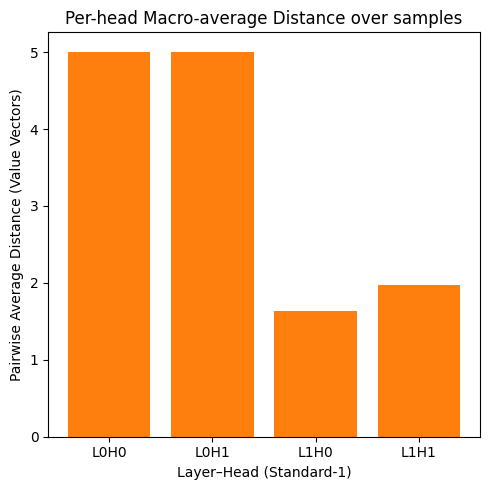

In [ ]:
def mean_pairwise(V):
    n = V.shape[0]
    if n < 2:
        return np.nan
    D = pairwise_distances(V, metric='euclidean')
    iu = np.triu_indices(n, k=1)
    return float(D[iu].mean())

# The average distance for each sample, each layer, and each head
df_dis = df_value[['layer','head','sample','values']].copy()
df_dis['avg_dist'] = df_dis['values'].apply(mean_pairwise)
df_dis = df_dis.dropna(subset=['avg_dist'])

macroavg = (df_dis.groupby(['layer','head'])['avg_dist']
         .mean().reset_index().sort_values(['layer','head']))


labels = [f"L{int(L)}H{int(H)}" for L,H in zip(macroavg['layer'], macroavg['head'])]
y = macroavg['avg_dist'].values

plt.figure(figsize=(5,5))
plt.bar(np.arange(len(y)), y, capsize=3,
        color='tab:orange', edgecolor='none')
plt.xticks(np.arange(len(y)), labels)
plt.ylabel("Pairwise Average Distance (Value Vectors)")
plt.xlabel("Layer–Head (Standard-1)")
plt.title("Per-head Macro-average Distance over samples")
plt.tight_layout()
plt.show()

# 1. Cosine of average angular distance in Value Vectors

## 1.1 Functions

In [ ]:
def angle_dis_mean(row, tok1, tok2):
  tok = np.asarray(row['tokens'])
  values = np.asarray(row['values'])
  t1 = np.where(tok == tok1)[0]
  t2 = np.where(tok == tok2)[0]
  if t1.size == 0 or t2.size == 0:
    return np.nan
  return float(np.cos(np.arccos(cosine_similarity(values[t1], values[t2])).mean()))

In [ ]:
def plot_cos(type_name, tok_name, tok1, tok2):
  df = df_value[['layer','head','sample','tokens','values']].copy()
  df['cos'] = df.apply(lambda r: angle_dis_mean(r, tok1, tok2), axis=1)
  order = sorted(df['sample'].unique().tolist())
  df['exid'] = df['sample'].map({s:i for i,s in enumerate(order)})
  df['cfg']  = df.apply(lambda r: f"L{int(r['layer'])}H{int(r['head'])}", axis=1)

  mat = df.pivot_table(index='cfg', columns='exid', values='cos', aggfunc='mean')
  cols = np.arange(int(df['exid'].min()), int(df['exid'].max())+1)
  mat = mat.reindex(columns=cols)

  arr = np.ma.masked_invalid(mat.values)
  cmap = plt.cm.coolwarm.copy()
  cmap.set_bad('lightgray')

  W = max(10, 0.35 * mat.shape[1])
  plt.figure(figsize=(W, 2.2))
  im = plt.imshow(arr, aspect='auto', cmap=cmap, vmin=-1, vmax=1, interpolation='nearest')
  plt.colorbar(im, label='cos(∀,∃)')
  plt.yticks(range(mat.shape[0]), mat.index)
  plt.xticks(np.arange(mat.shape[1]), cols, fontsize=7)

  for i in range(mat.shape[0]):
      for j in range(mat.shape[1]):
          v = mat.iat[i, j]
          if not np.isnan(v):
              plt.text(j, i, f"{v:.2f}", ha='center', va='center', fontsize=7, color='black')

  plt.xlabel(f'Sample index ({type_name})')
  plt.ylabel('Layer–Head')
  plt.title(f'{tok_name} Cosine in Value Vectors')
  plt.tight_layout()
  plt.show()

## 1.2 Draw

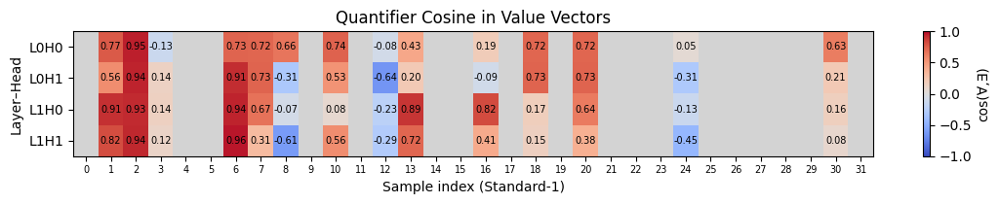

In [ ]:
plot_cos("Standard-1","Quantifier",uni_id, exi_id)

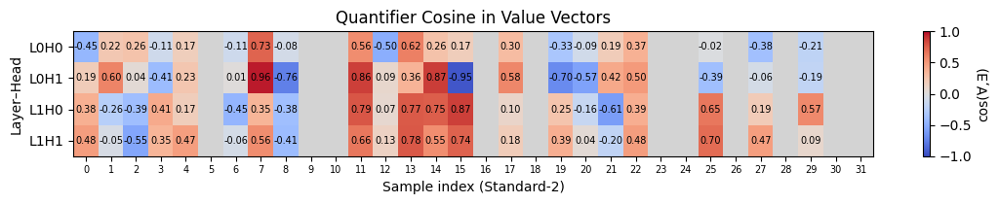

In [ ]:
plot_cos("Standard-2","Quantifier",uni_id, exi_id)

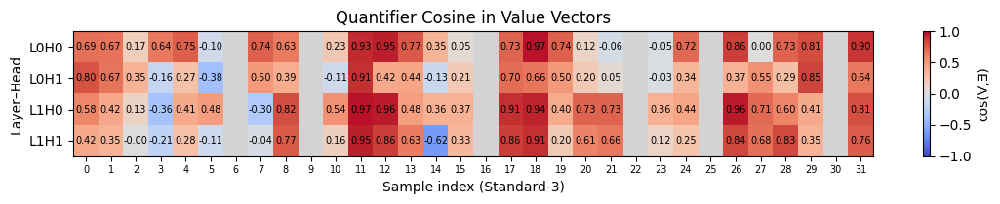

In [ ]:
plot_cos("Standard-3","Quantifier",uni_id, exi_id)

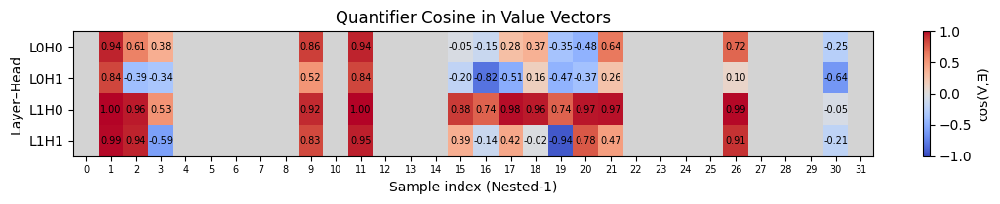

In [ ]:
plot_cos("Nested-1","Quantifier",uni_id, exi_id)

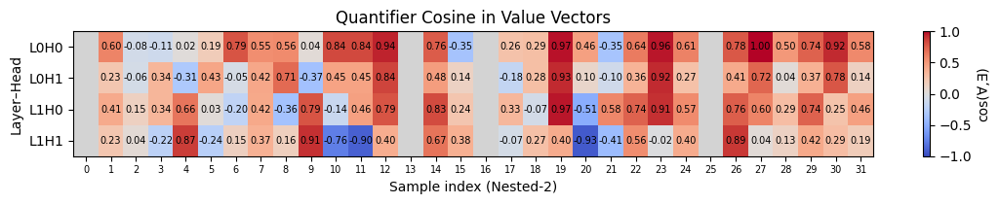

In [ ]:
plot_cos("Nested-2","Quantifier",uni_id, exi_id)

# 2. Attention Heatmaps

## 2.1 Functions

In [ ]:
logits = [item['logits'] for item in data]

In [ ]:
sample_id = 0
batch_id = 0
layer_id  = 0
head_id   = 0

In [ ]:
entry = next(
    d for d in data
    if d['sample']==sample_id and d['batch']==batch_id and d['layer']==layer_id and d['head']==head_id
)

In [ ]:
logits = np.array(entry['logits'])
attn   = np.array(entry['attn'])
value  = np.array(entry['values'])

In [ ]:
tokens = entry['tokens']
token_labels = [idx2tok[i] for i in tokens]
dim_labels = [i for i in range(4)]

In [ ]:
mask = [i for i, tok in enumerate(token_labels) if tok != '-']
filtered_logits = logits[mask, :]
filtered_attn   = attn[np.ix_(mask, mask)]
filtered_value  = value[mask, :]
filtered_labels = [token_labels[i] for i in mask]

In [ ]:
def heatmap(ax, mat, xticks, yticks, title, map_type,
      cmap='viridis', fmt="{:.2f}", fontsize=6, text_color=None):
    if map_type == 'Attention':
      im = ax.imshow(mat, aspect='auto', cmap=cmap, vmin=0, vmax=1)
    elif map_type == 'Value':
      im = ax.imshow(mat, aspect='auto', cmap=cmap, vmin=-6, vmax=6)
    elif map_type == 'Weighted':
      im = ax.imshow(mat, aspect='auto', cmap=cmap, vmin=-5, vmax=5)
    else:
      im = ax.imshow(mat, aspect='auto', cmap=cmap)
    ax.set_title(title)
    ax.set_xticks(range(len(xticks)))
    ax.set_xticklabels(xticks, rotation=0, fontsize=fontsize)
    ax.set_yticks(range(len(yticks)))
    ax.set_yticklabels(yticks, fontsize=fontsize)
    for i in range(mat.shape[0]):
        for j in range(mat.shape[1]):
            val = mat[i, j]
            if text_color is not None:
                c = text_color
            else:
                c = 'black' if val > 0.49 else 'white'
            ax.text(j, i, fmt.format(val),
                    ha="center", va="center",
                    fontsize=fontsize, color=c)
    return im

In [ ]:
def draw(
    data, sample_id, batch_id,
    map_type='logits',
    layers=(0, 1), heads=(0, 1),
    figsize=(8, 8)
):
    fig, axes = plt.subplots(len(layers), len(heads), figsize=figsize)
    for i, layer_id in enumerate(layers):
        for j, head_id in enumerate(heads):
            entry = next(
                d for d in data
                if d['sample'] == sample_id
                and d.get('batch', None) == batch_id
                and d['layer'] == layer_id
                and d['head'] == head_id
            )
            tokens = entry['tokens']
            labels = [idx2tok[t] for t in tokens]
            mask = [k for k, t in enumerate(labels) if t != '-']

            if map_type == 'Logit':
                mat_full = np.array(entry['logits'])
                mat = mat_full[np.ix_(mask, mask)]
                xticks = yticks = [labels[k] for k in mask]
                cmap = 'viridis'
                text_color = None

            elif map_type == 'Attention':
                mat_full = np.array(entry['attn'])
                mat = mat_full[np.ix_(mask, mask)]
                xticks = yticks = [labels[k] for k in mask]
                cmap = 'viridis'
                text_color = None

            elif map_type == 'Value':
                mat_full = np.array(entry['values'])
                mat = mat_full[mask, :]
                xticks = [str(d) for d in range(mat_full.shape[1])]
                yticks = [labels[k] for k in mask]
                cmap = 'coolwarm'
                text_color = 'black'

            elif map_type == 'Weighted':
                attn_arr = np.array(entry['attn'])
                value_arr = np.array(entry['values'])
                mat_full = attn_arr @ value_arr
                mat = mat_full[mask, :]
                xticks = [str(d) for d in range(mat_full.shape[1])]
                yticks = [labels[k] for k in mask]
                cmap = 'coolwarm'
                text_color = 'black'

            else:
                raise ValueError(f"Unknown map_type: {map_type}")

            ax = axes[i][j] if len(layers) > 1 else axes[j]
            title = f"{map_type}: L{layer_id} H{head_id}"
            im = heatmap(
                ax, mat,
                xticks,
                yticks,
                title=title,
                map_type=map_type,
                cmap=cmap,
                text_color=text_color
            )
            fig.colorbar(im, ax=ax).ax.tick_params(labelsize=8)

    plt.tight_layout()
    plt.show()

## 2.2 Draw

#### Type1_dmodel8

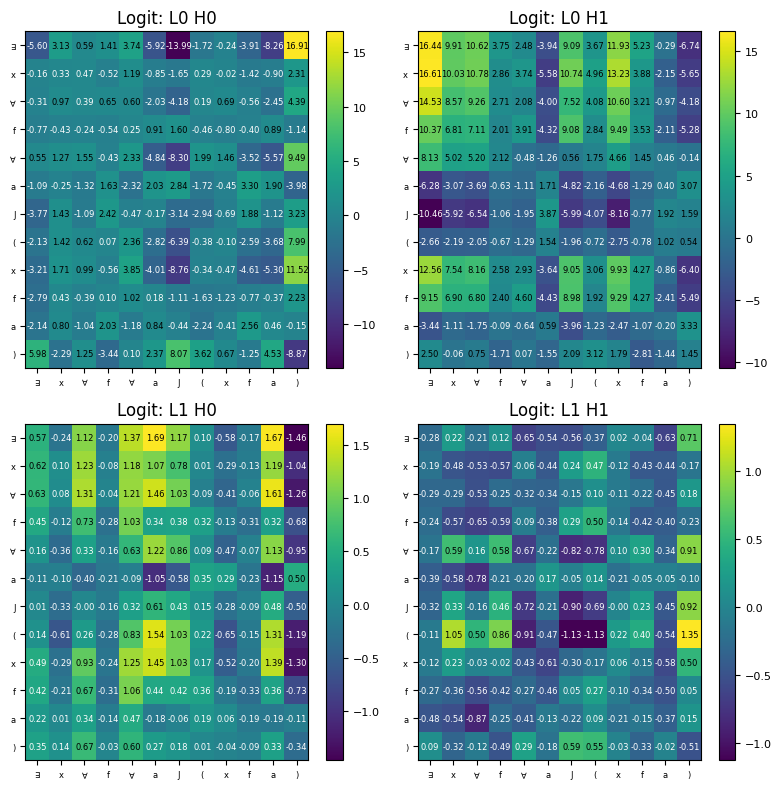

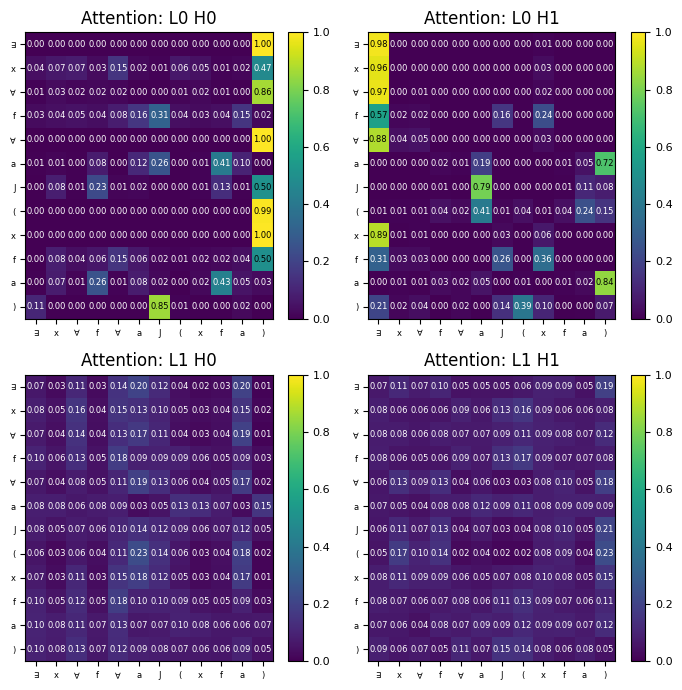

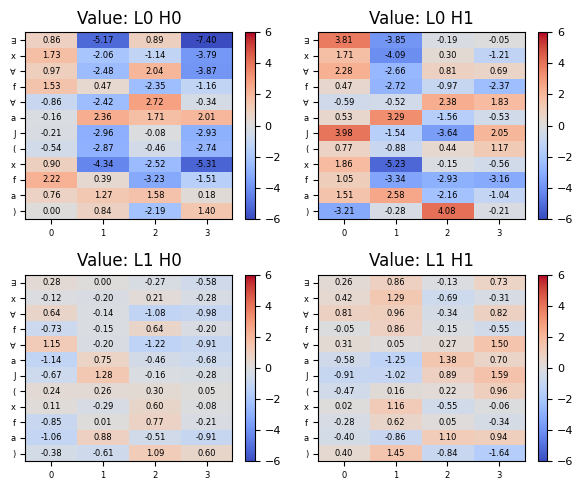

In [ ]:
draw(data, sample_id=1, batch_id=0, figsize=(8, 8), map_type='Logit')
draw(data, sample_id=1, batch_id=0, figsize=(7, 7), map_type='Attention')
draw(data, sample_id=1, batch_id=0, figsize=(6, 5), map_type='Value')

#### Type2_dmodel8

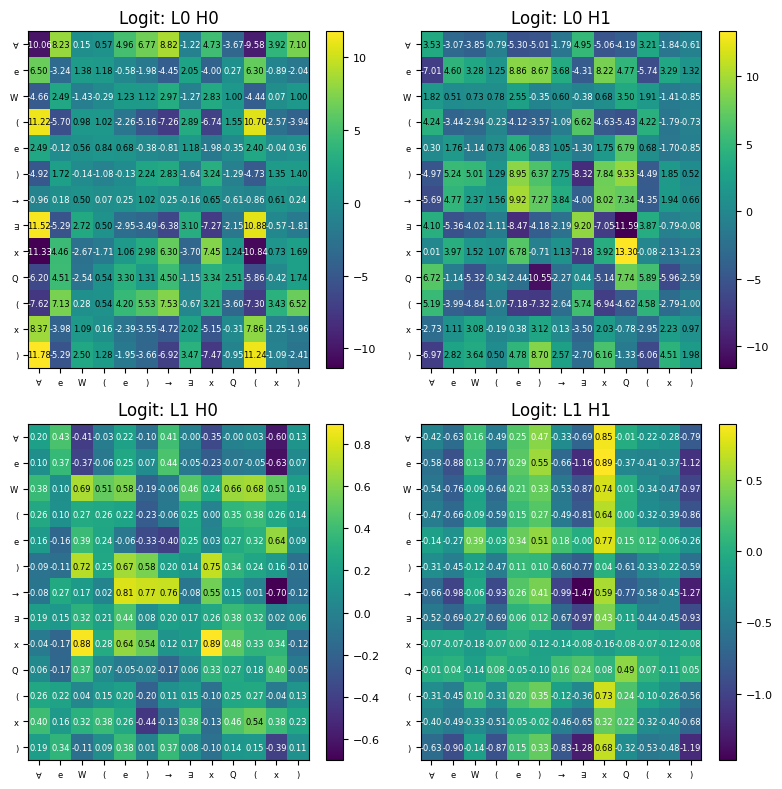

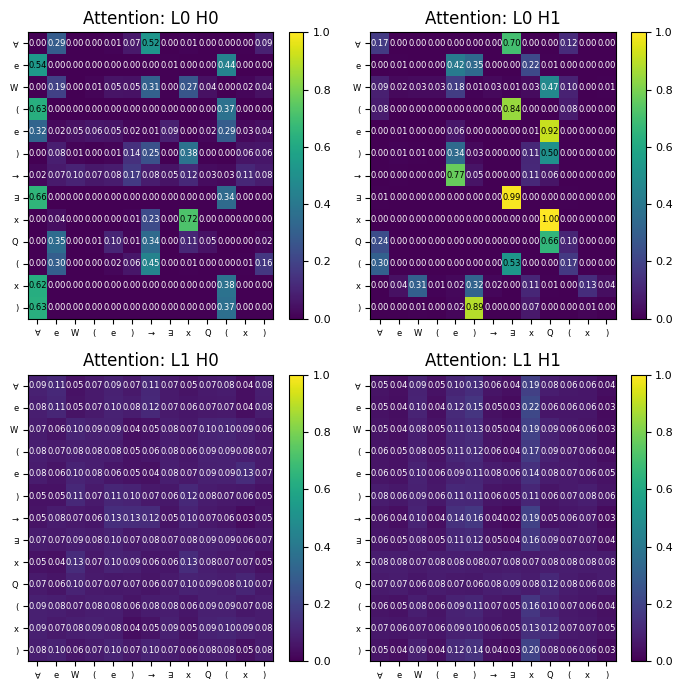

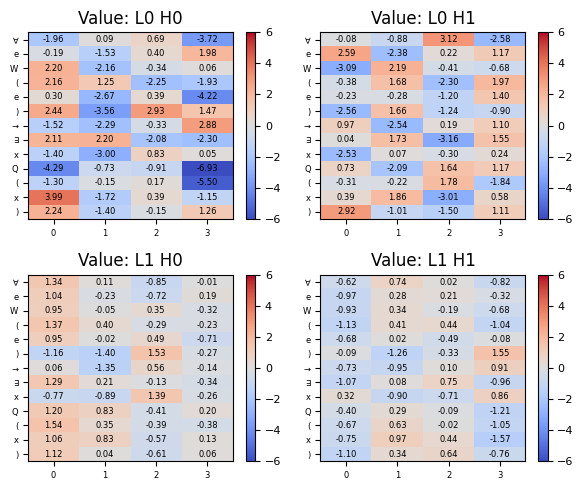

In [ ]:
draw(data, sample_id=15, batch_id=0, figsize=(8, 8), map_type='Logit')
draw(data, sample_id=15, batch_id=0, figsize=(7, 7), map_type='Attention')
draw(data, sample_id=15, batch_id=0, figsize=(6, 5), map_type='Value')

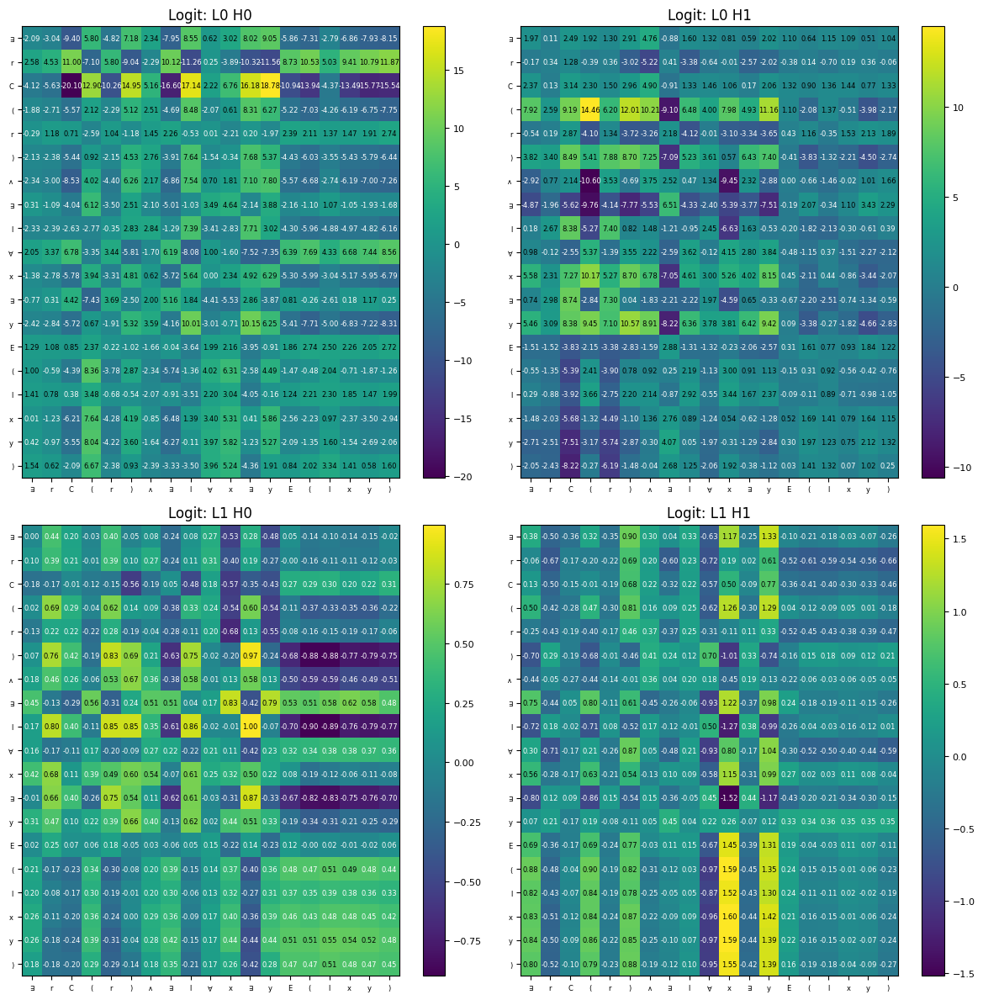

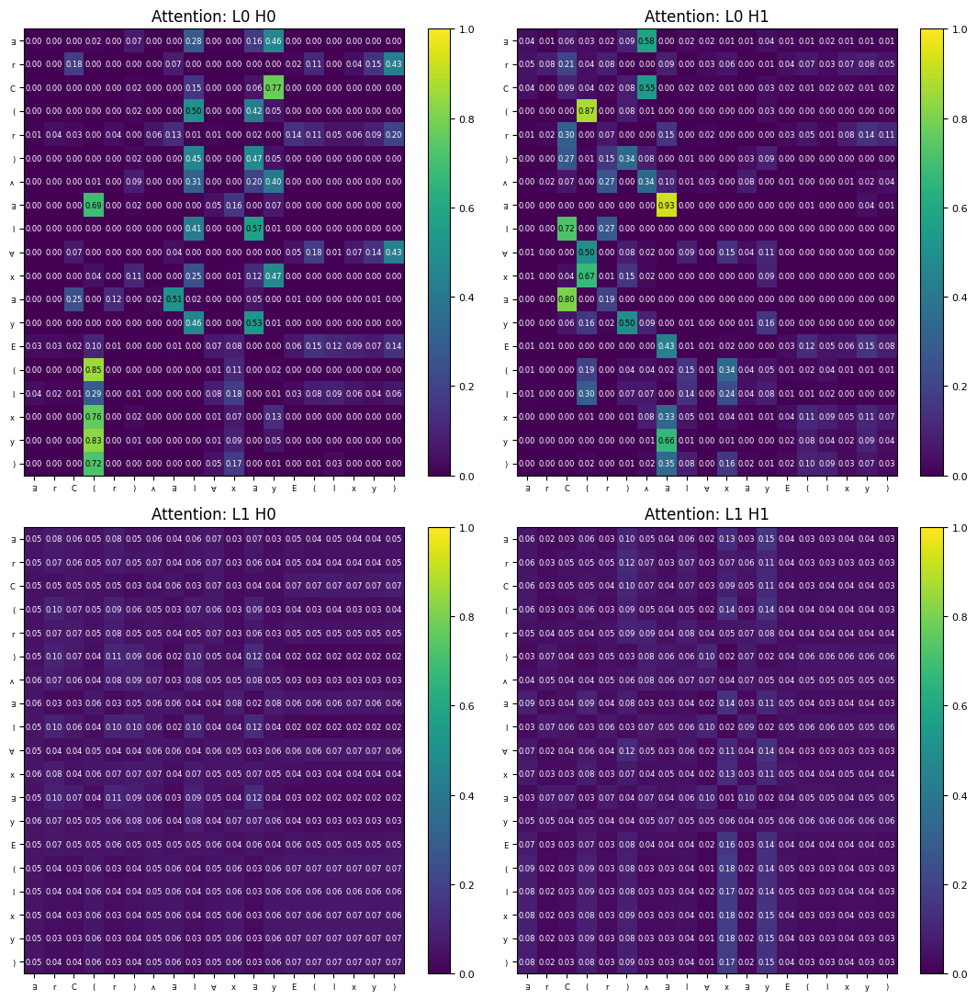

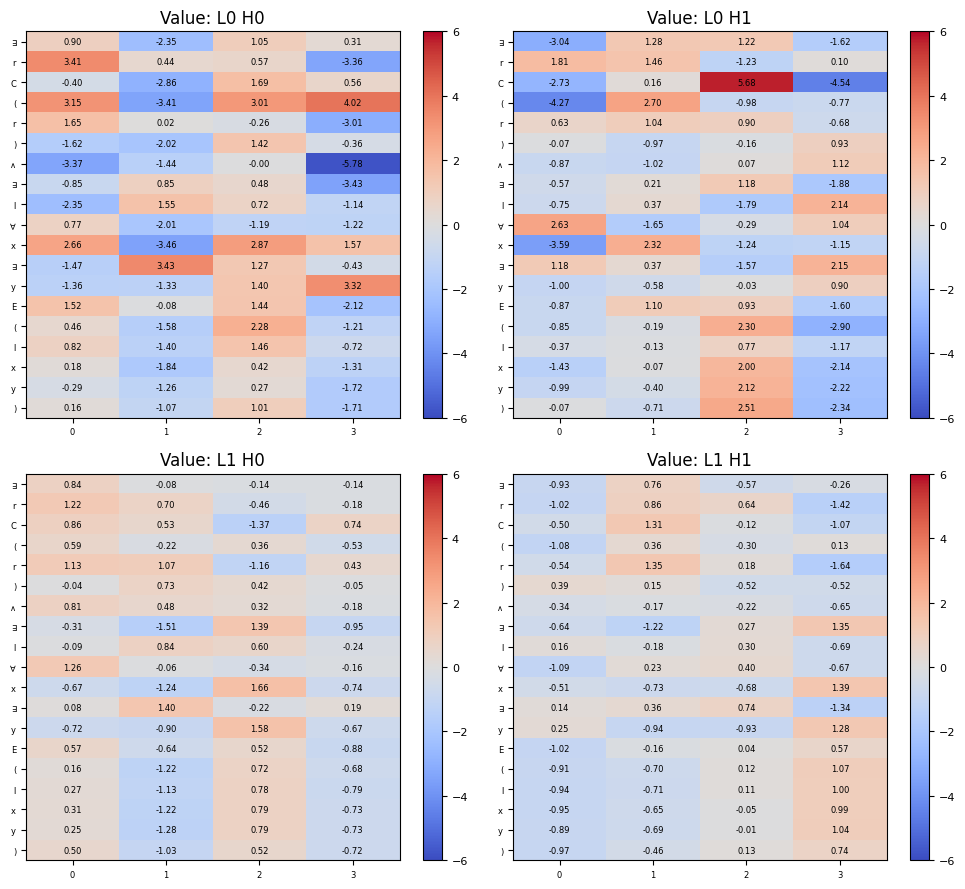

In [ ]:
draw(data, sample_id=3, batch_id=0, figsize=(12, 12), map_type='Logit')
draw(data, sample_id=3, batch_id=0, figsize=(11, 11), map_type='Attention')
draw(data, sample_id=3, batch_id=0, figsize=(10, 9), map_type='Value')

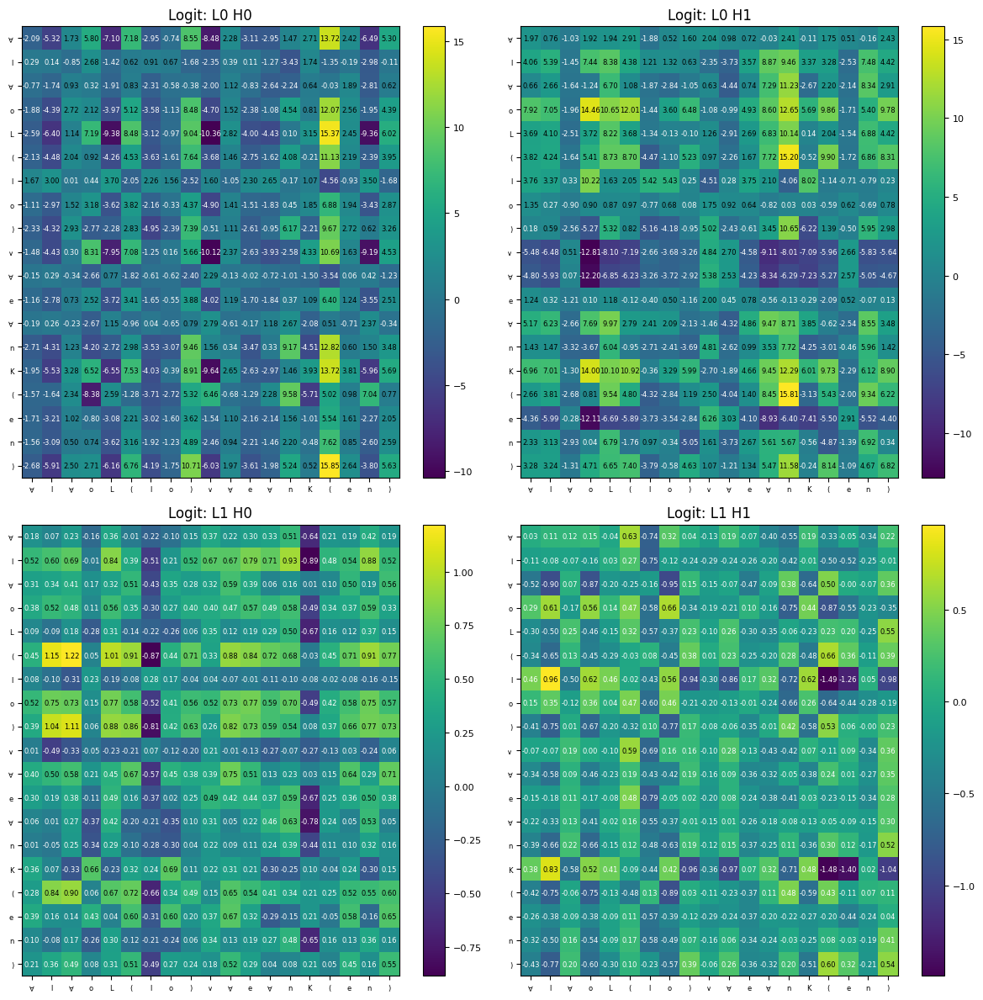

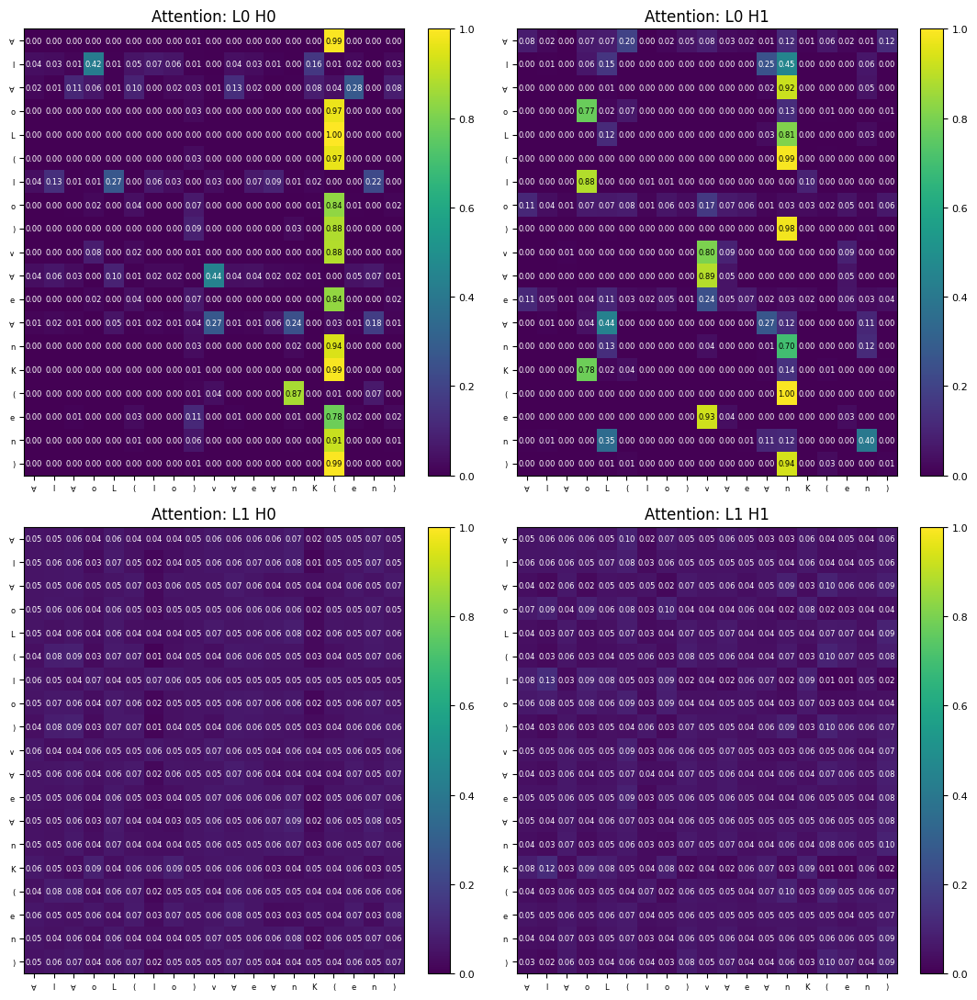

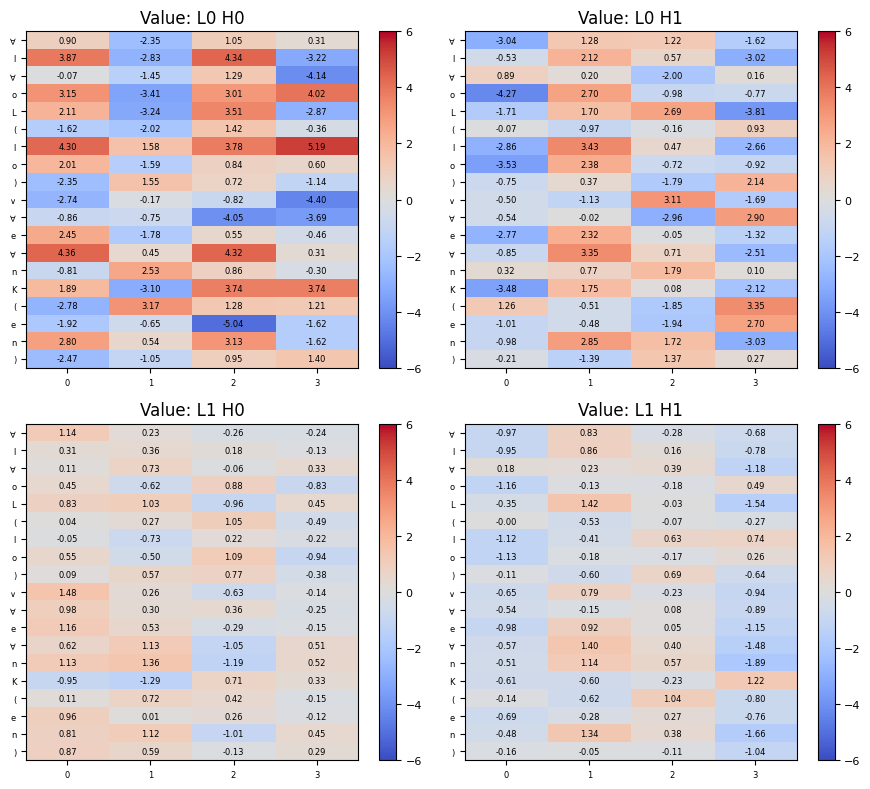

In [ ]:
draw(data, sample_id=5, batch_id=0, figsize=(12, 12), map_type='Logit')
draw(data, sample_id=5, batch_id=0, figsize=(11, 11), map_type='Attention')
draw(data, sample_id=5, batch_id=0, figsize=(9, 8), map_type='Value')

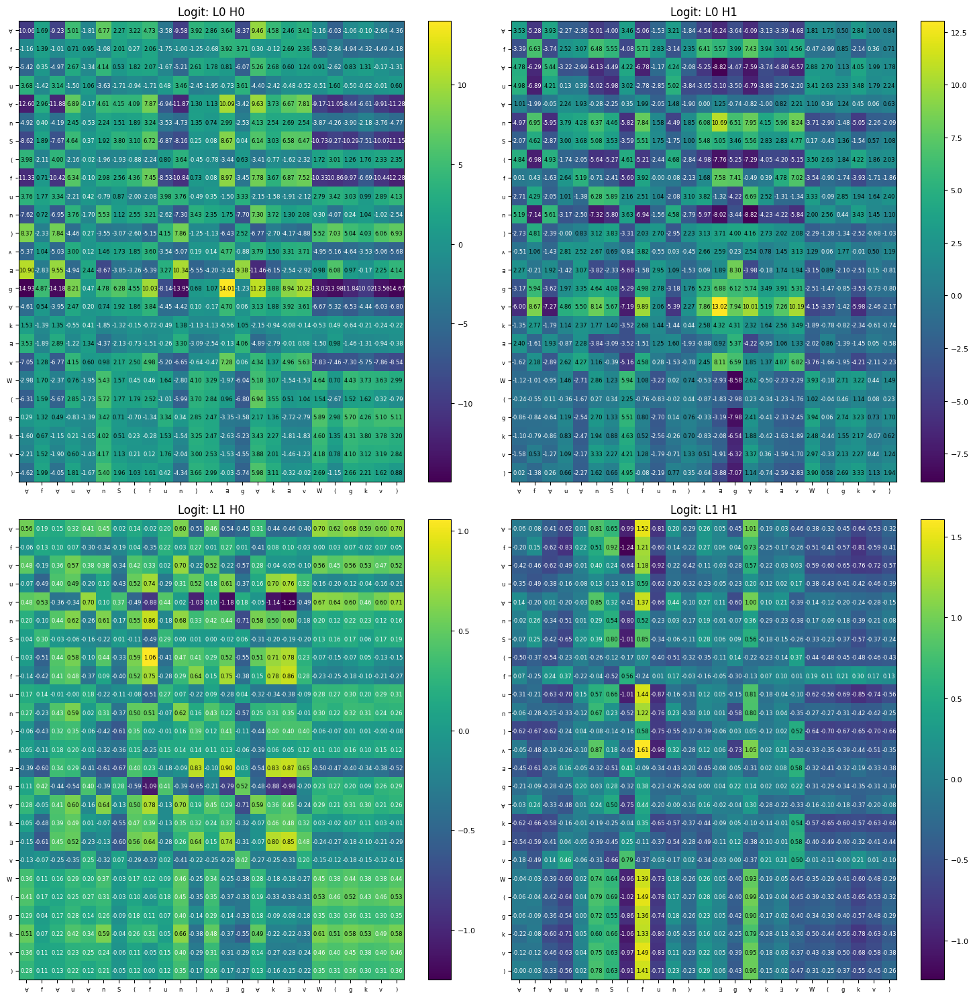

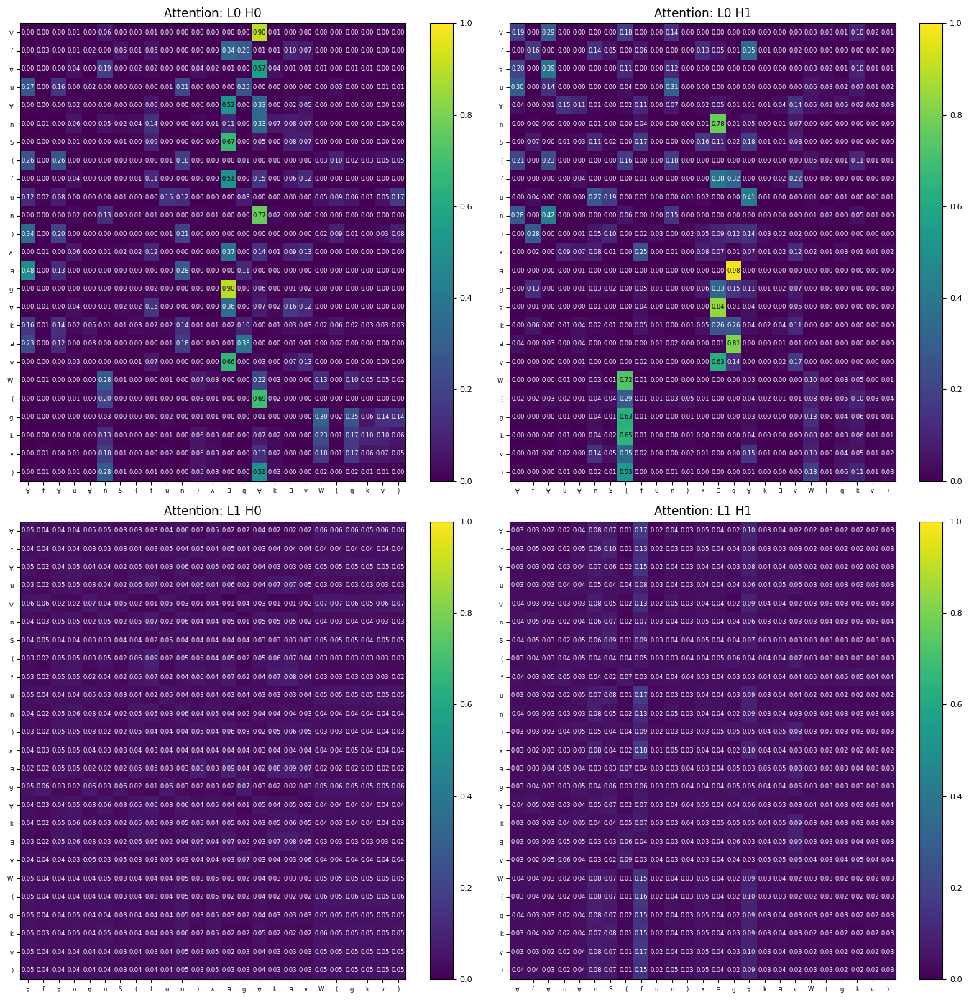

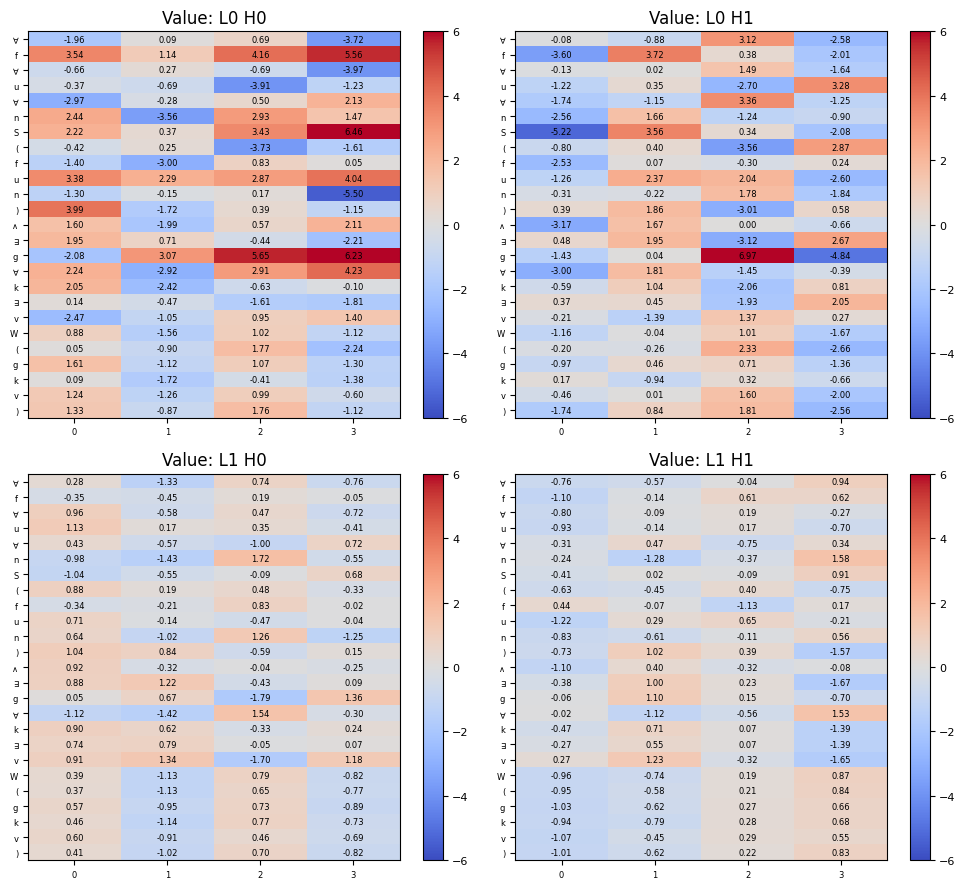

In [ ]:
draw(data, sample_id=8, batch_id=0, figsize=(15, 15), map_type='Logit')
draw(data, sample_id=8, batch_id=0, figsize=(14, 14), map_type='Attention')
draw(data, sample_id=8, batch_id=0, figsize=(10, 9), map_type='Value')

#### Type2_dmodel256

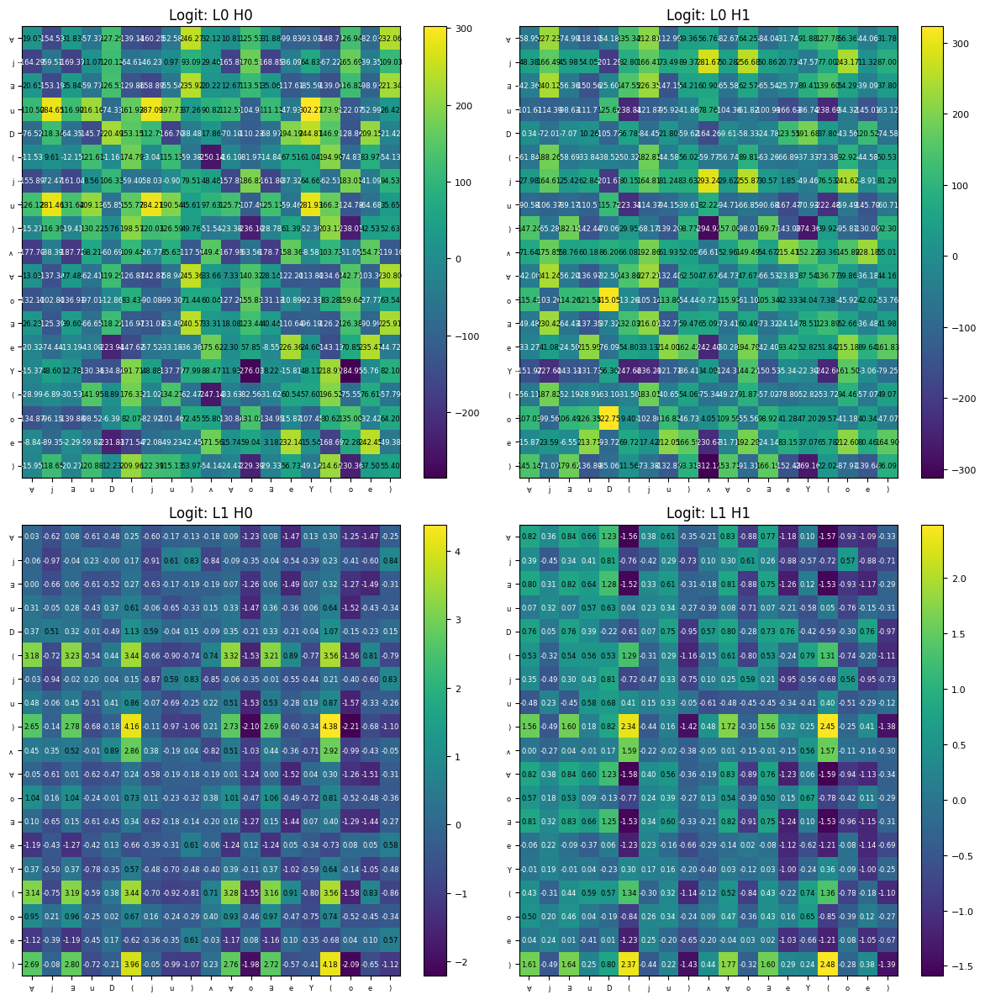

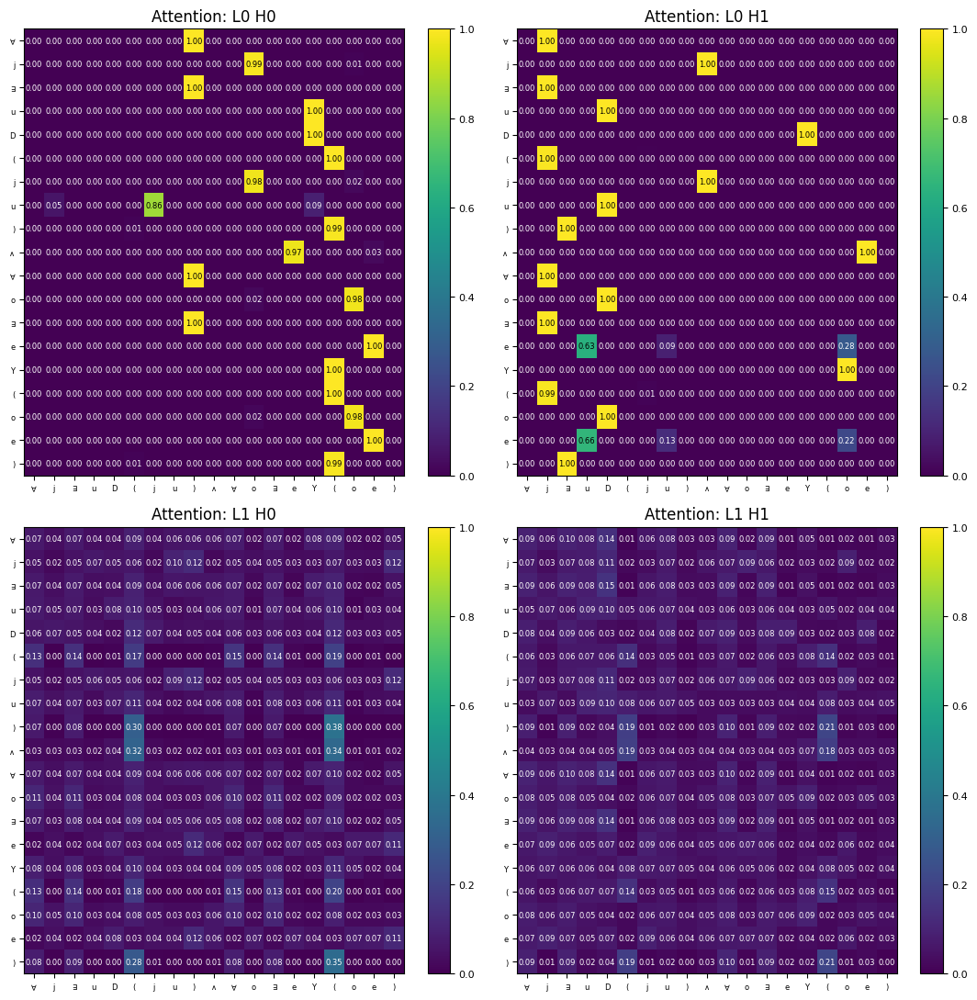

In [ ]:
draw(data, sample_id=8, batch_id=0, figsize=(12, 12), map_type='Logit')
draw(data, sample_id=8, batch_id=0, figsize=(11, 11), map_type='Attention')

#### Type3

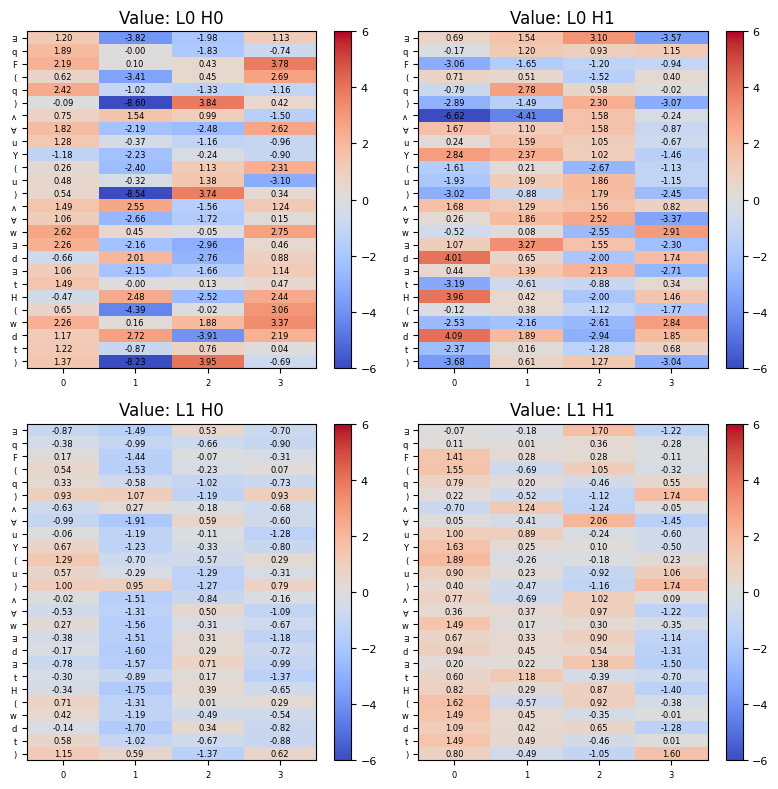

In [ ]:
# draw(data, sample_id=11, batch_id=0, figsize=(8, 8), map_type='Logit')
# draw(data, sample_id=11, batch_id=0, figsize=(8, 8), map_type='Attention')
draw(data, sample_id=11, batch_id=0, figsize=(8, 8), map_type='Value')

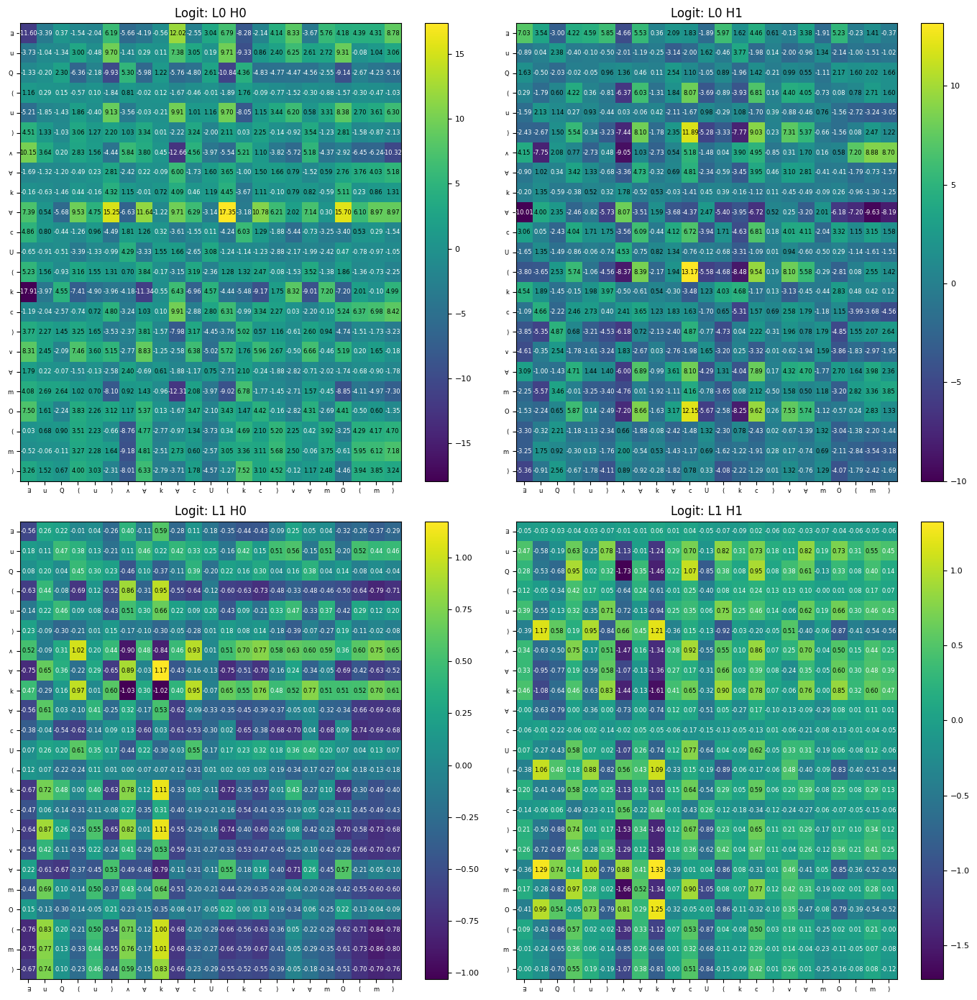

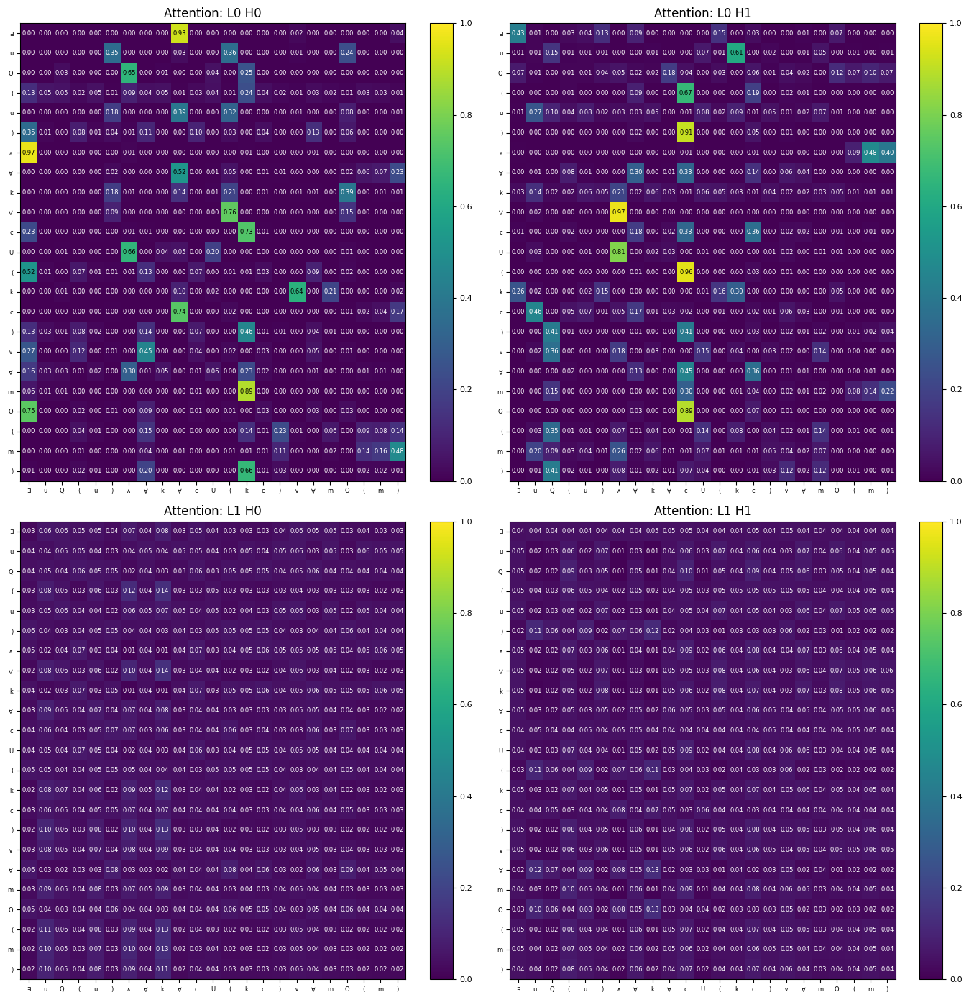

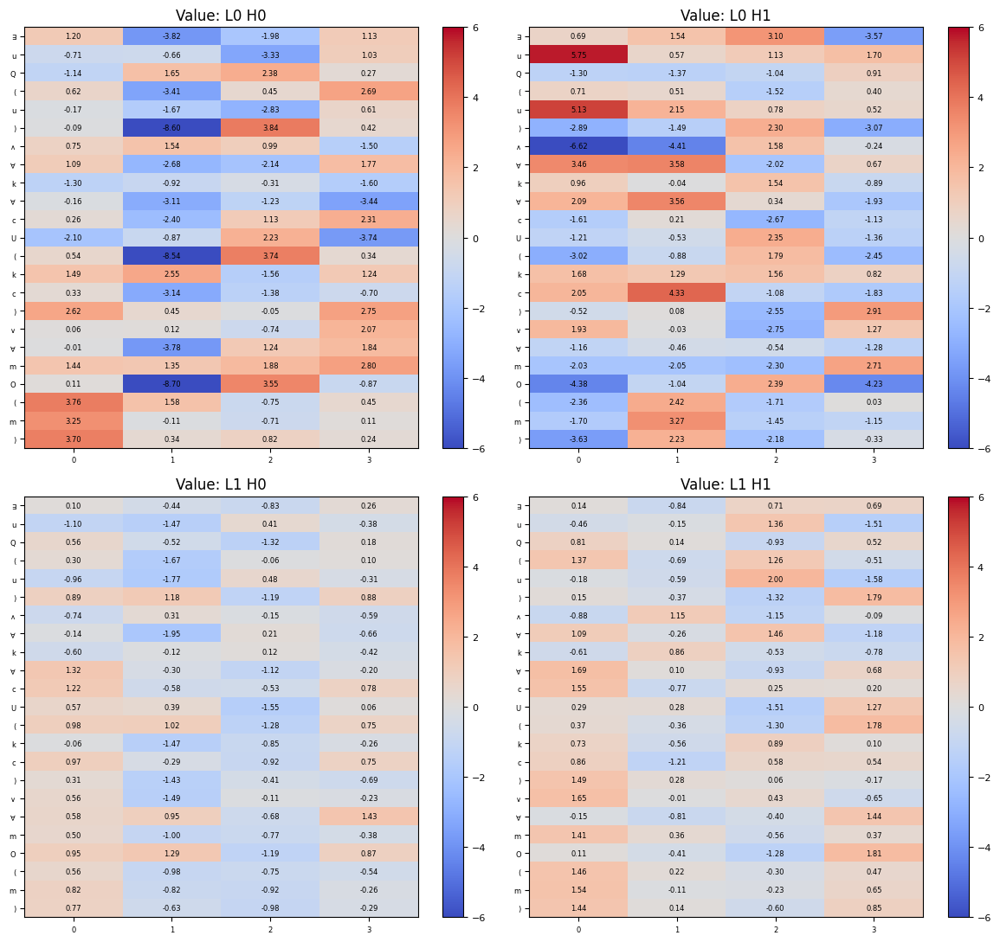

In [ ]:
draw(data, sample_id=4, batch_id=0, figsize=(14, 14), map_type='Logit')
draw(data, sample_id=4, batch_id=0, figsize=(14, 14), map_type='Attention')
draw(data, sample_id=4, batch_id=0, figsize=(12, 11), map_type='Value')

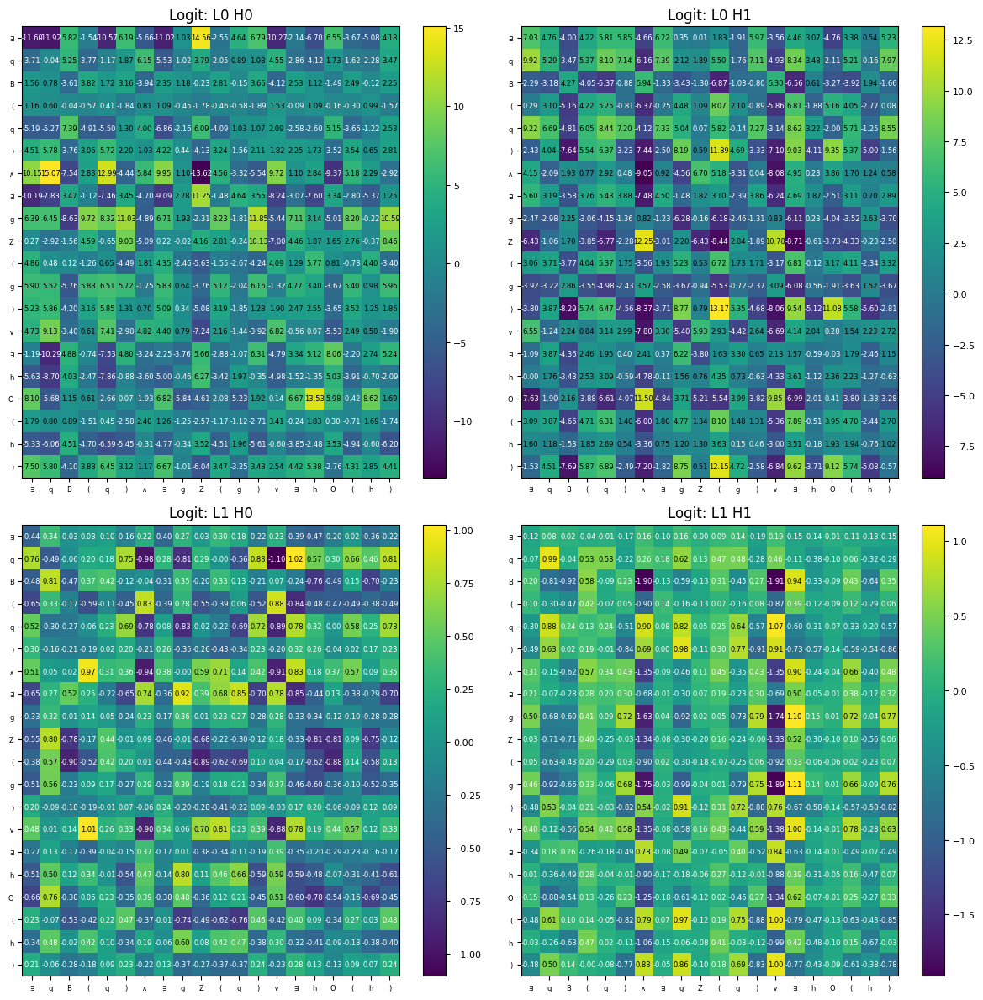

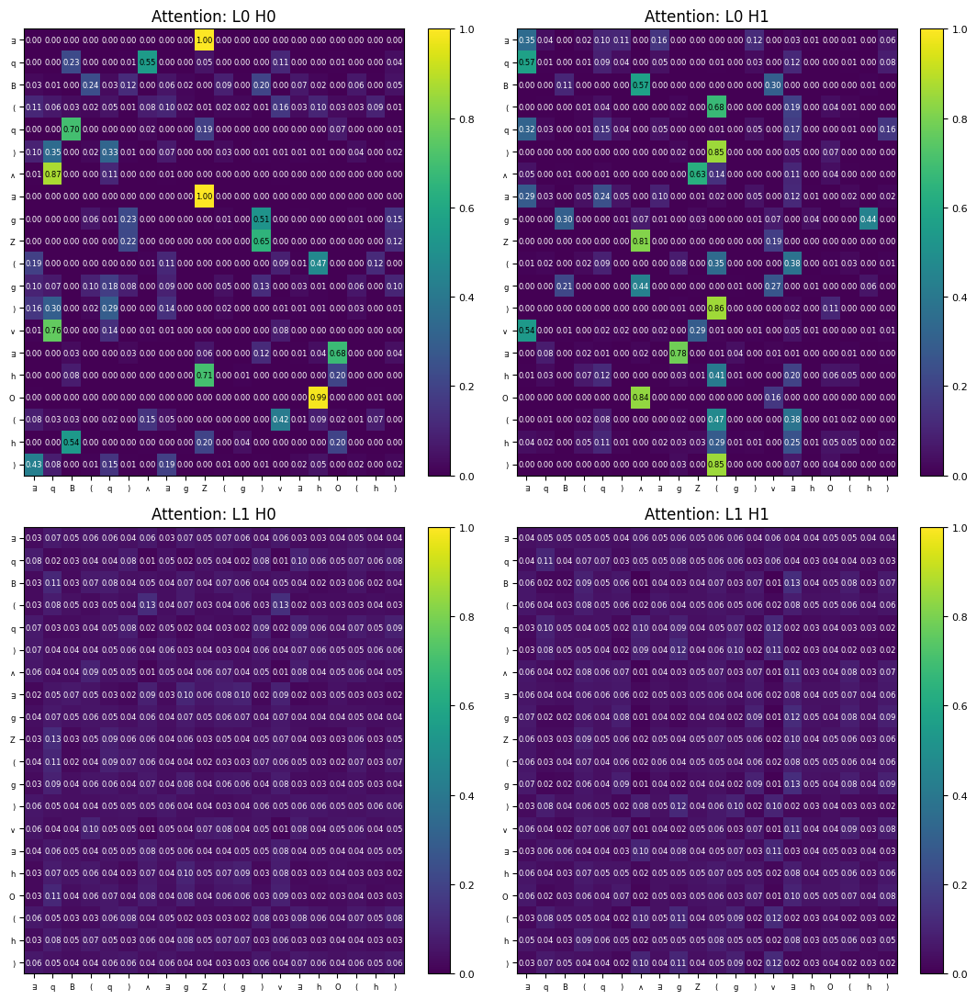

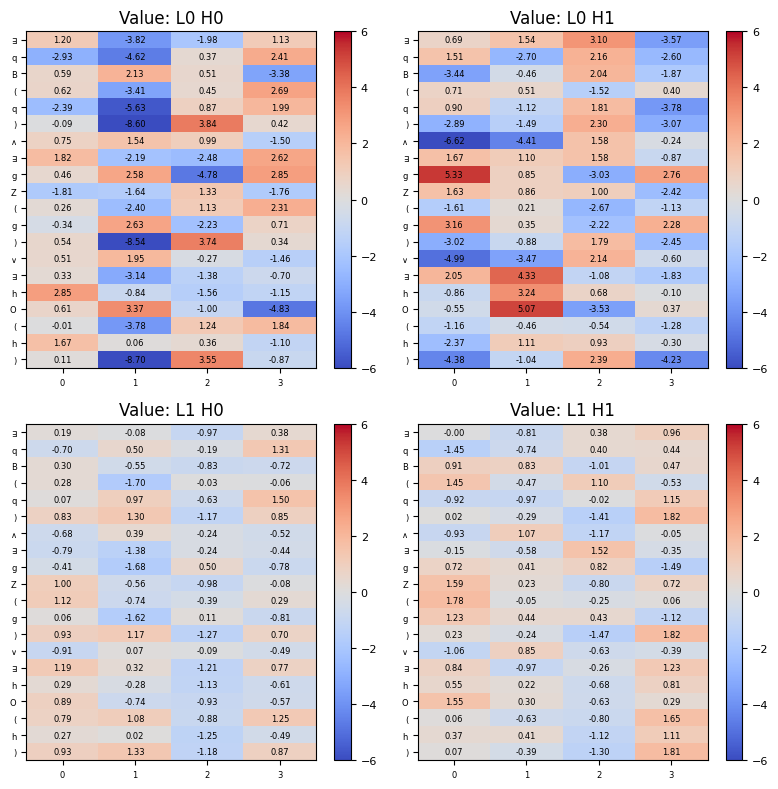

In [ ]:
draw(data, sample_id=16, batch_id=0, figsize=(12, 12), map_type='Logit')
draw(data, sample_id=16, batch_id=0, figsize=(11, 11), map_type='Attention')
draw(data, sample_id=16, batch_id=0, figsize=(8, 8), map_type='Value')

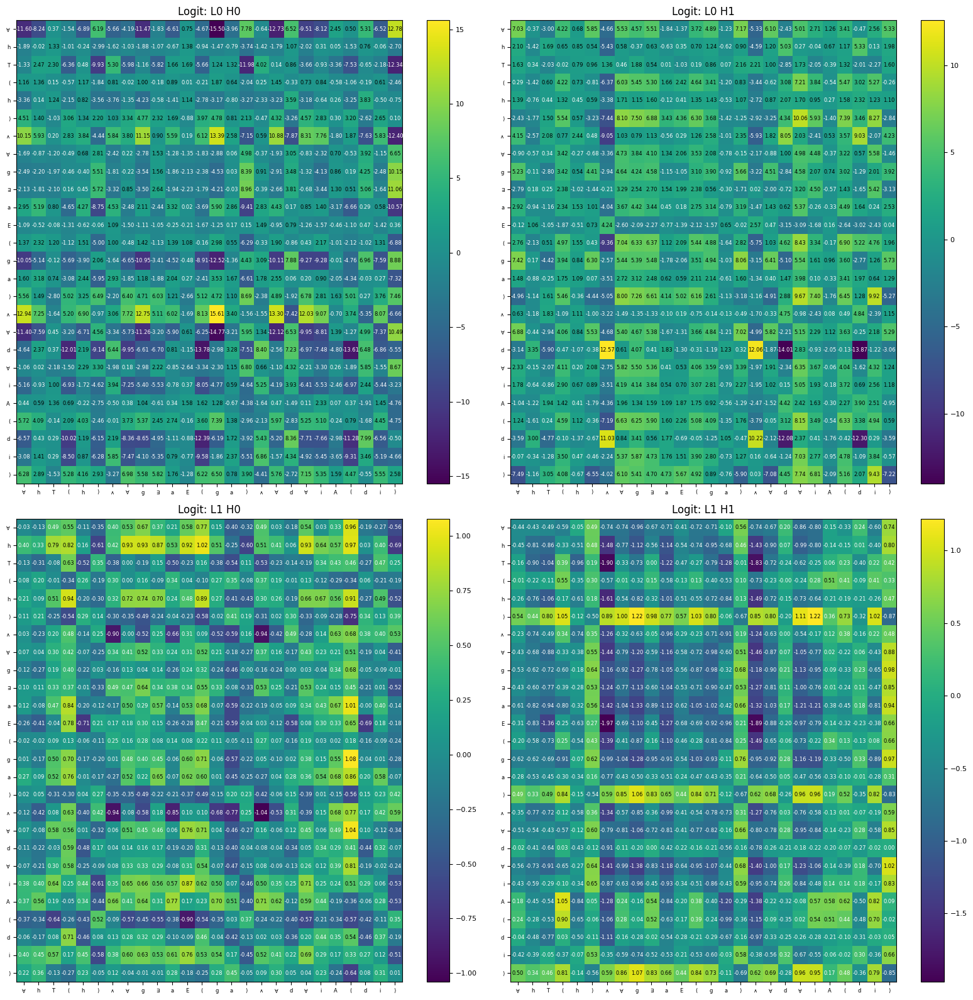

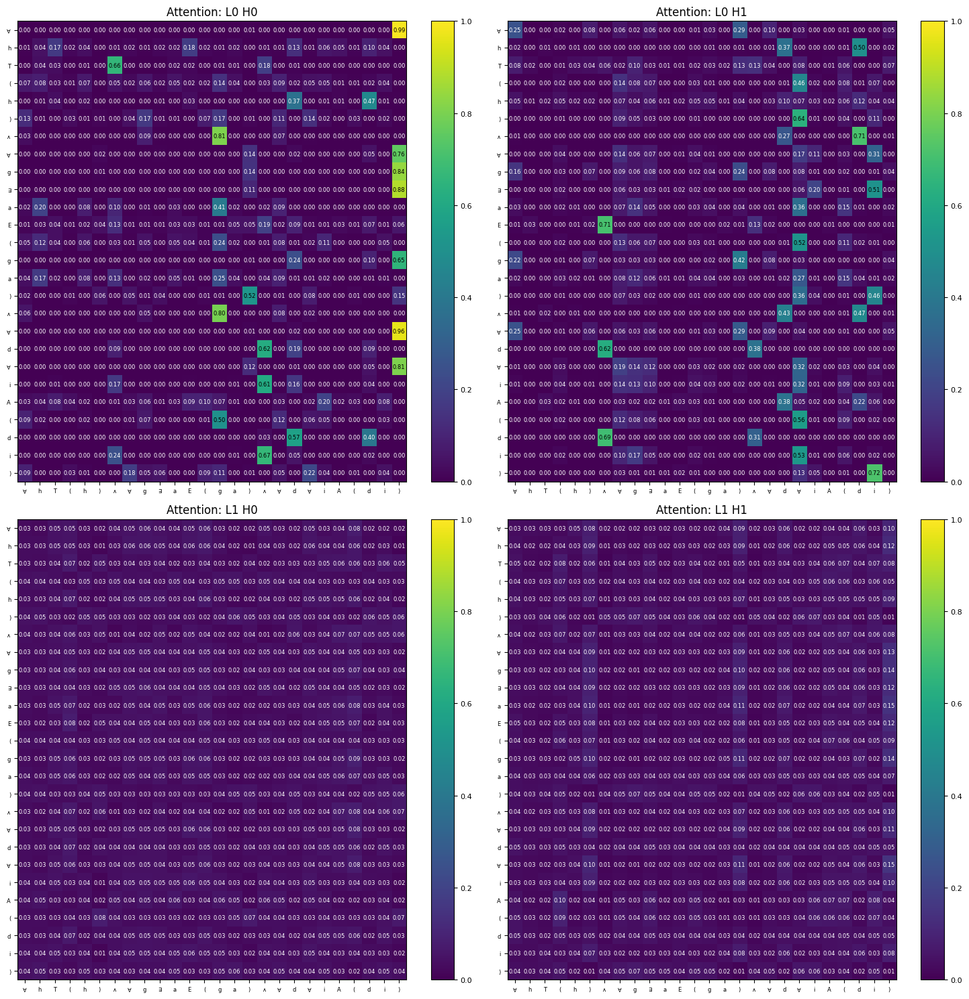

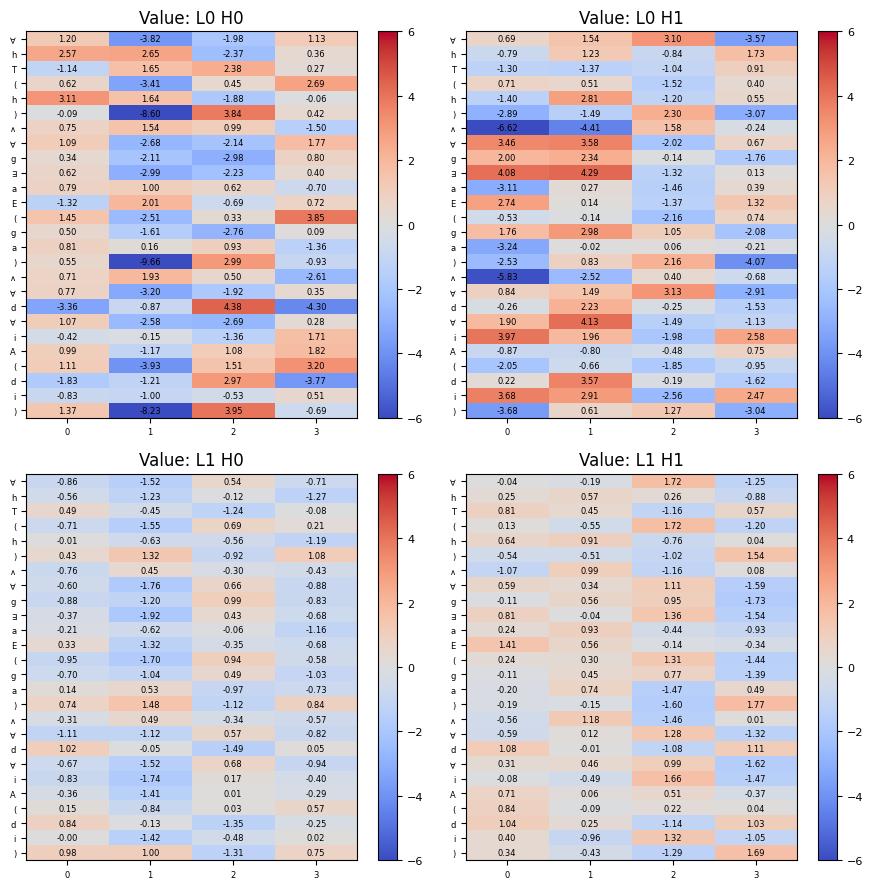

In [ ]:
draw(data, sample_id=18, batch_id=0, figsize=(16, 16), map_type='Logit')
draw(data, sample_id=18, batch_id=0, figsize=(15, 15), map_type='Attention')
draw(data, sample_id=18, batch_id=0, figsize=(9, 9), map_type='Value')

#### Type4

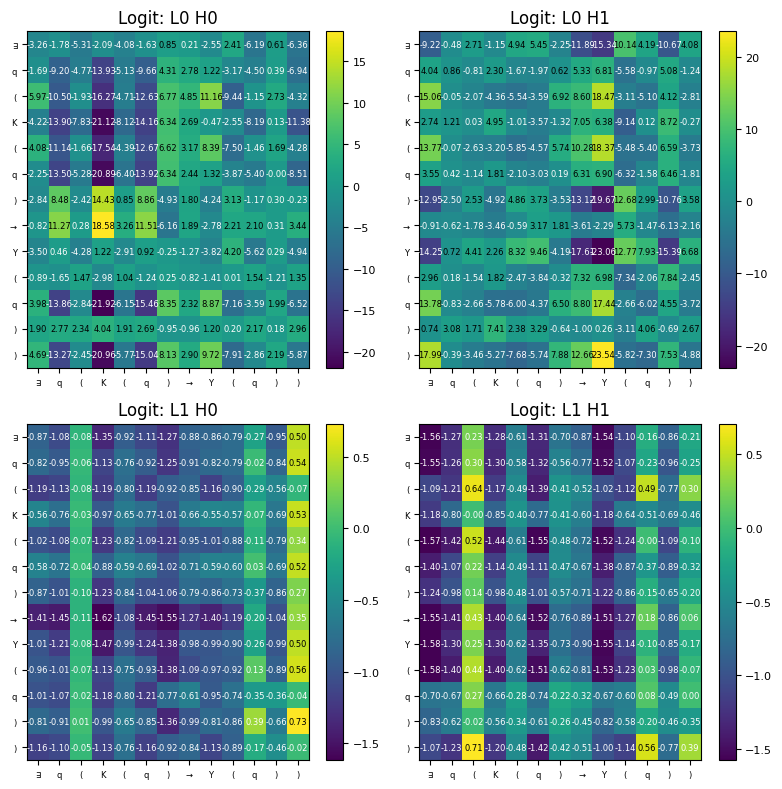

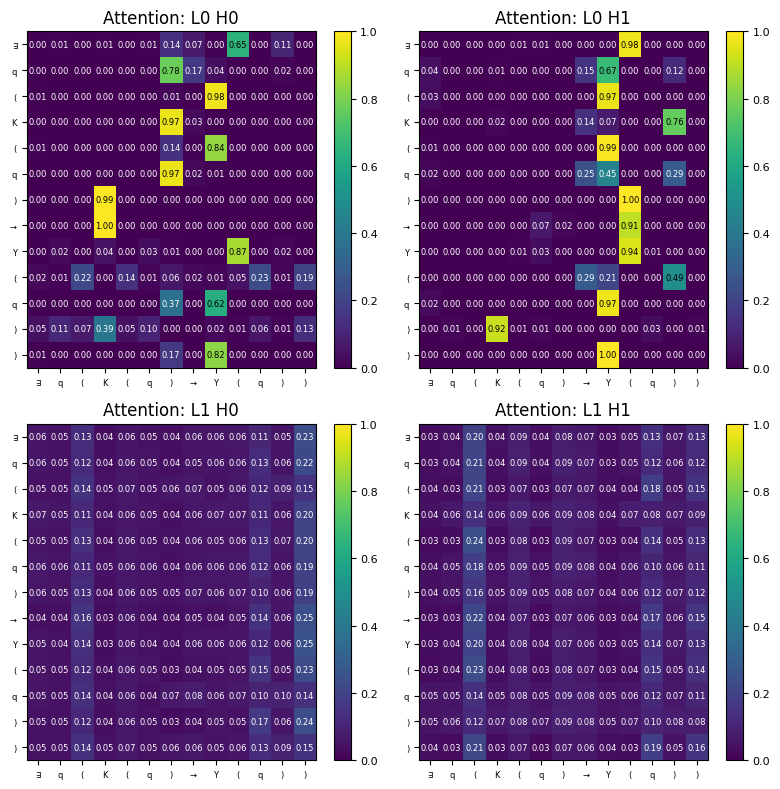

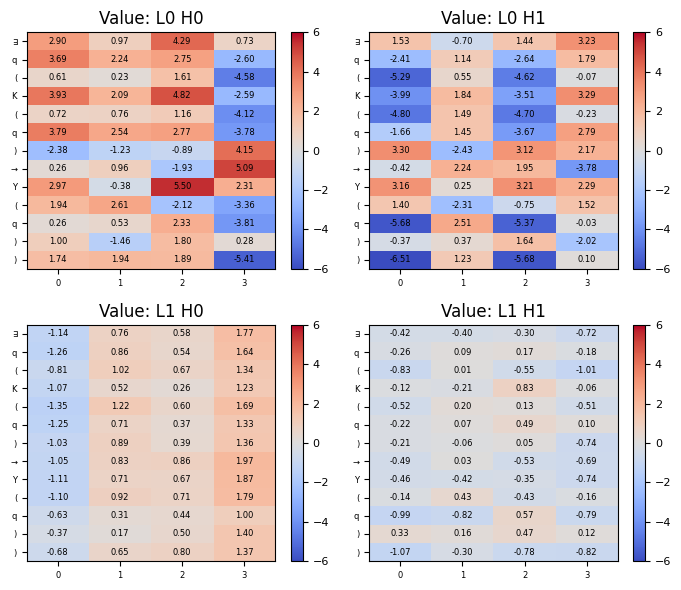

In [ ]:
draw(data, sample_id=4, batch_id=0, figsize=(8, 8), map_type='Logit')
draw(data, sample_id=4, batch_id=0, figsize=(8, 8), map_type='Attention')
draw(data, sample_id=4, batch_id=0, figsize=(7, 6), map_type='Value')

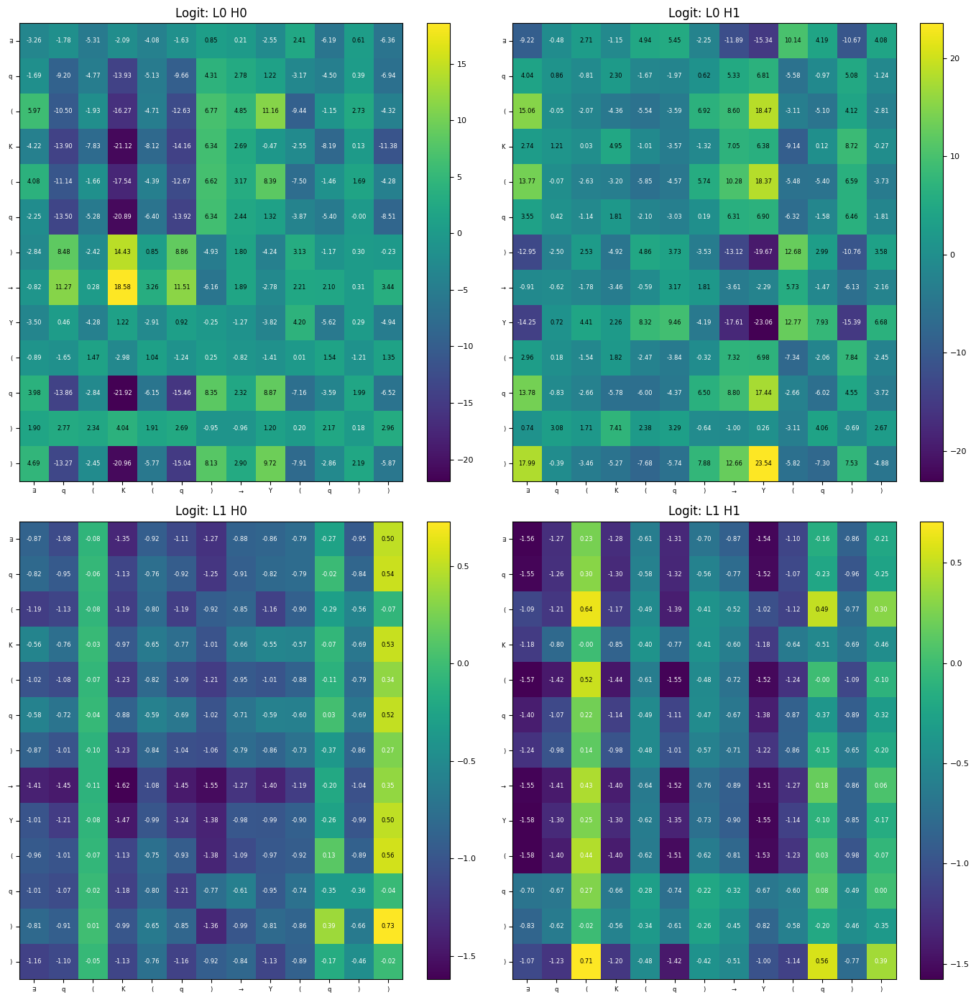

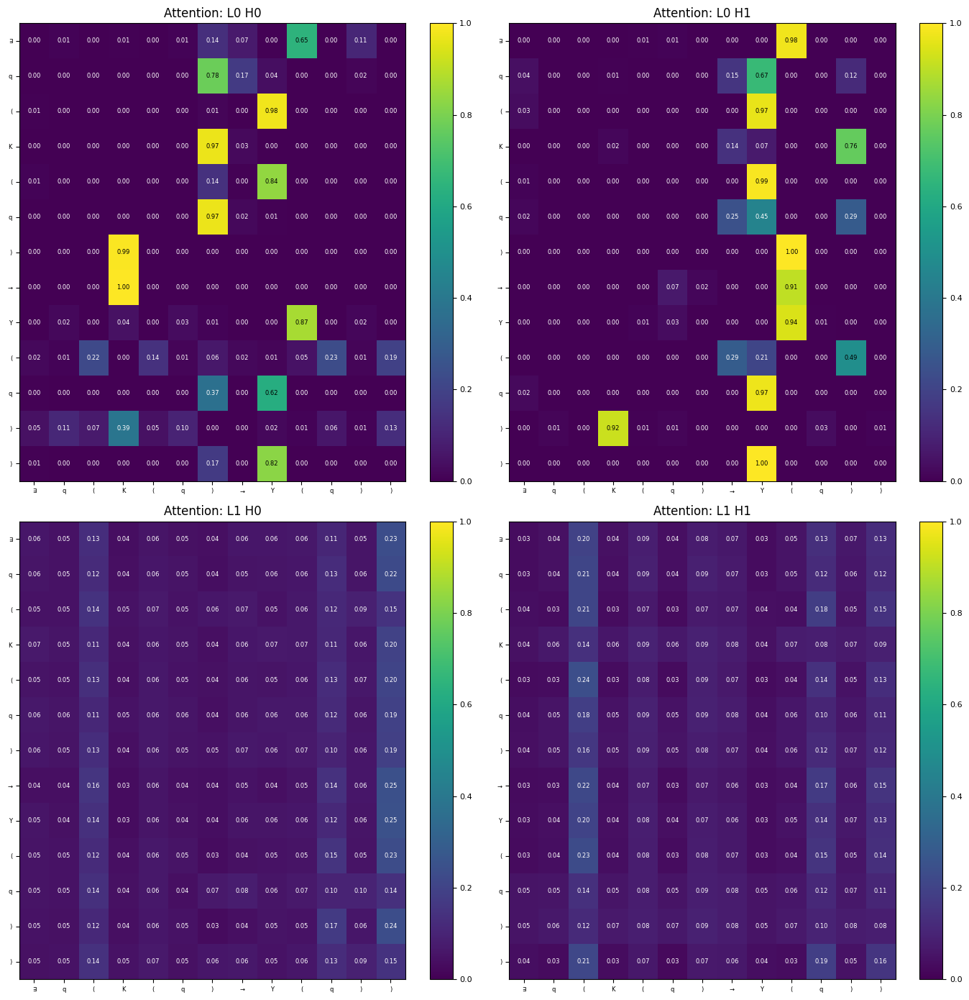

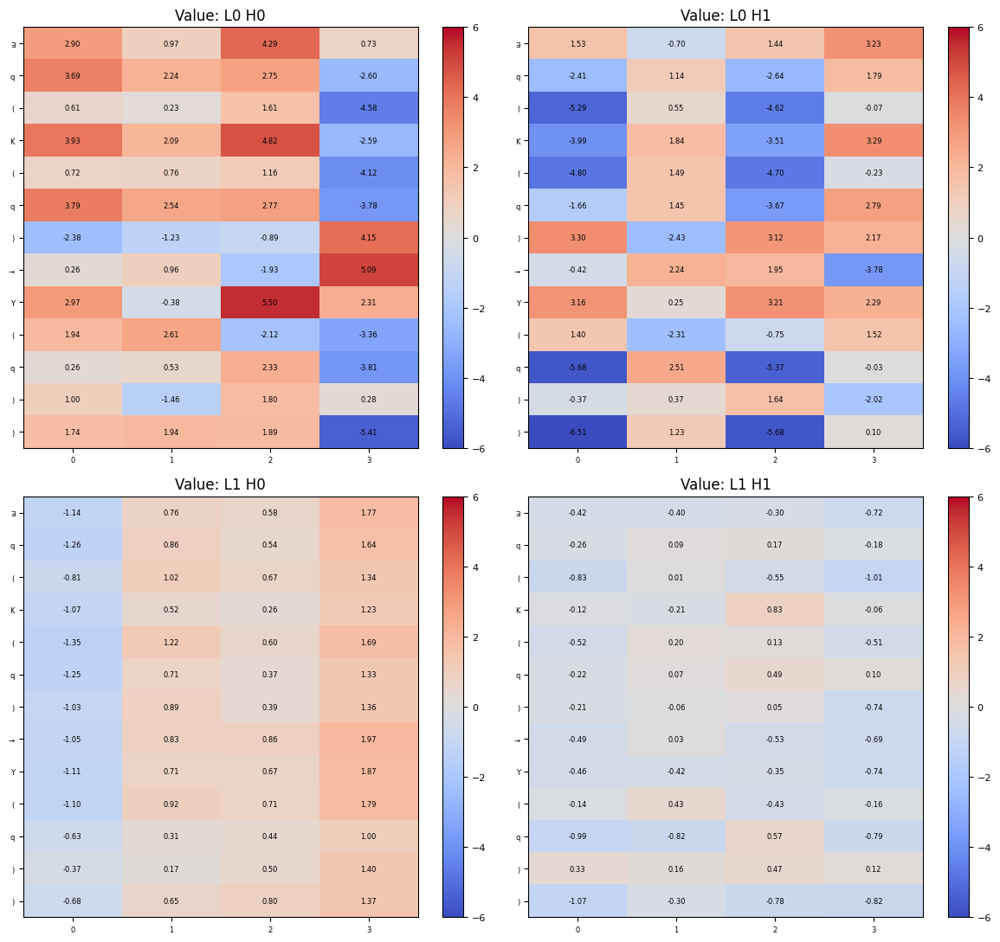

In [ ]:
draw(data, sample_id=4, batch_id=0, figsize=(14, 14), map_type='Logit')
draw(data, sample_id=4, batch_id=0, figsize=(14, 14), map_type='Attention')
draw(data, sample_id=4, batch_id=0, figsize=(12, 11), map_type='Value')

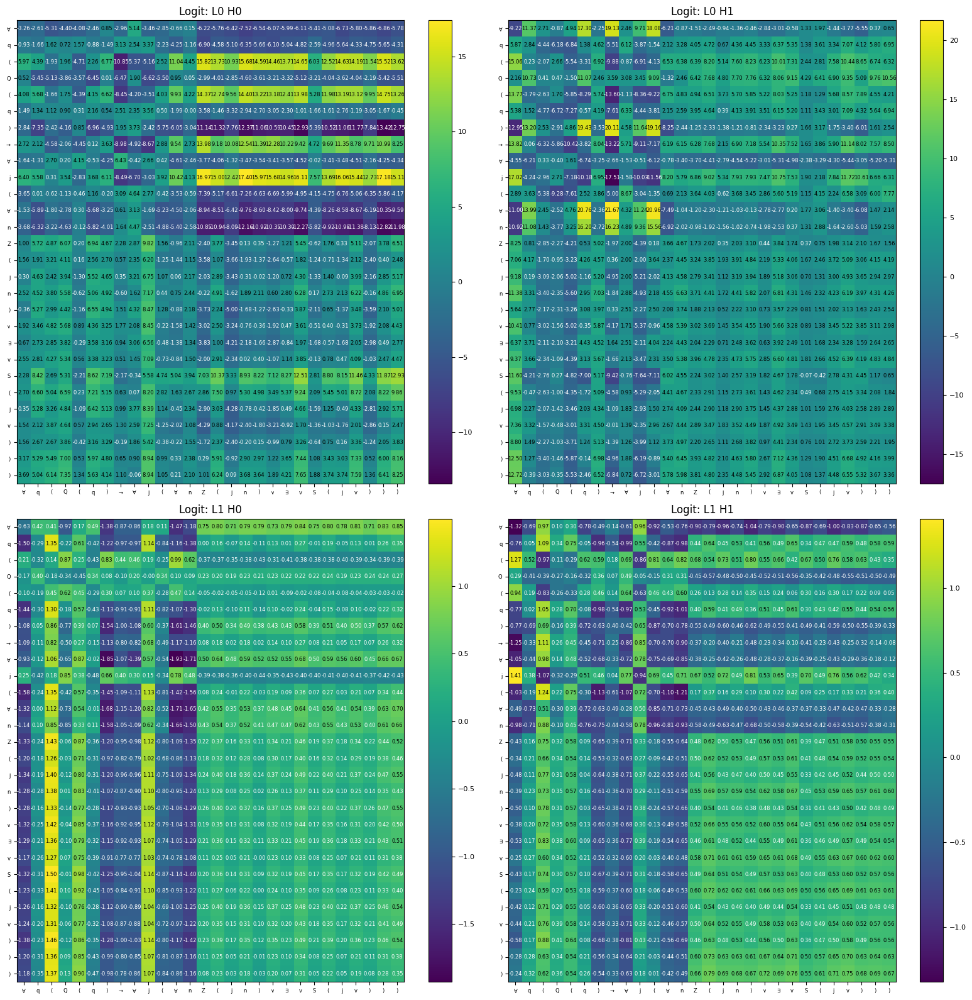

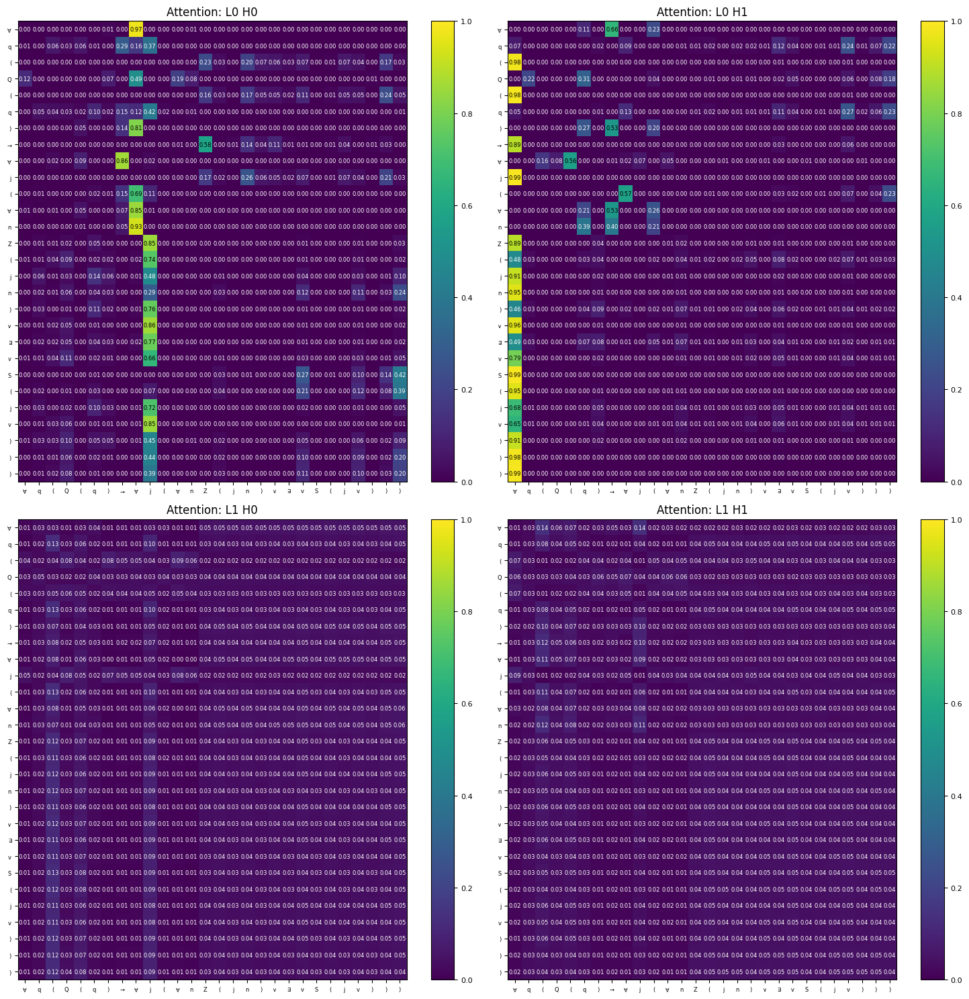

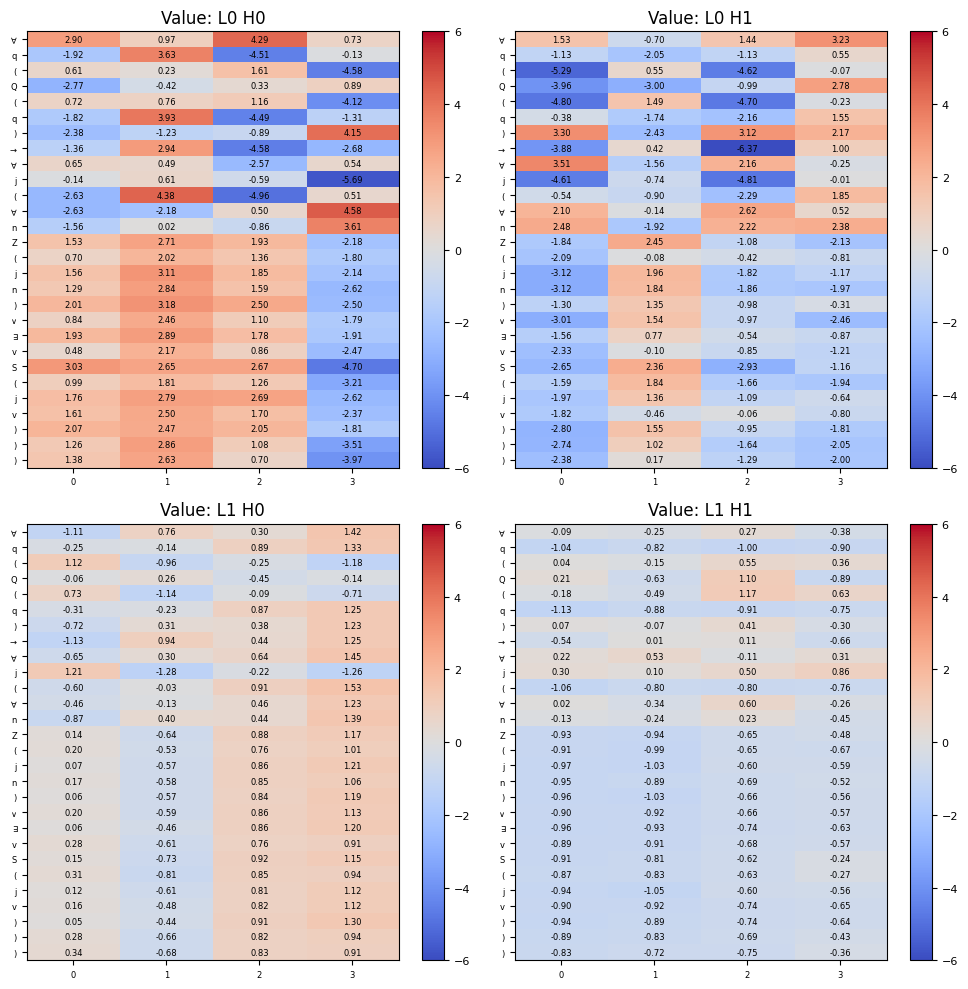

In [ ]:
draw(data, sample_id=16, batch_id=0, figsize=(16, 16), map_type='Logit')
draw(data, sample_id=16, batch_id=0, figsize=(15, 15), map_type='Attention')
draw(data, sample_id=16, batch_id=0, figsize=(10, 10), map_type='Value')

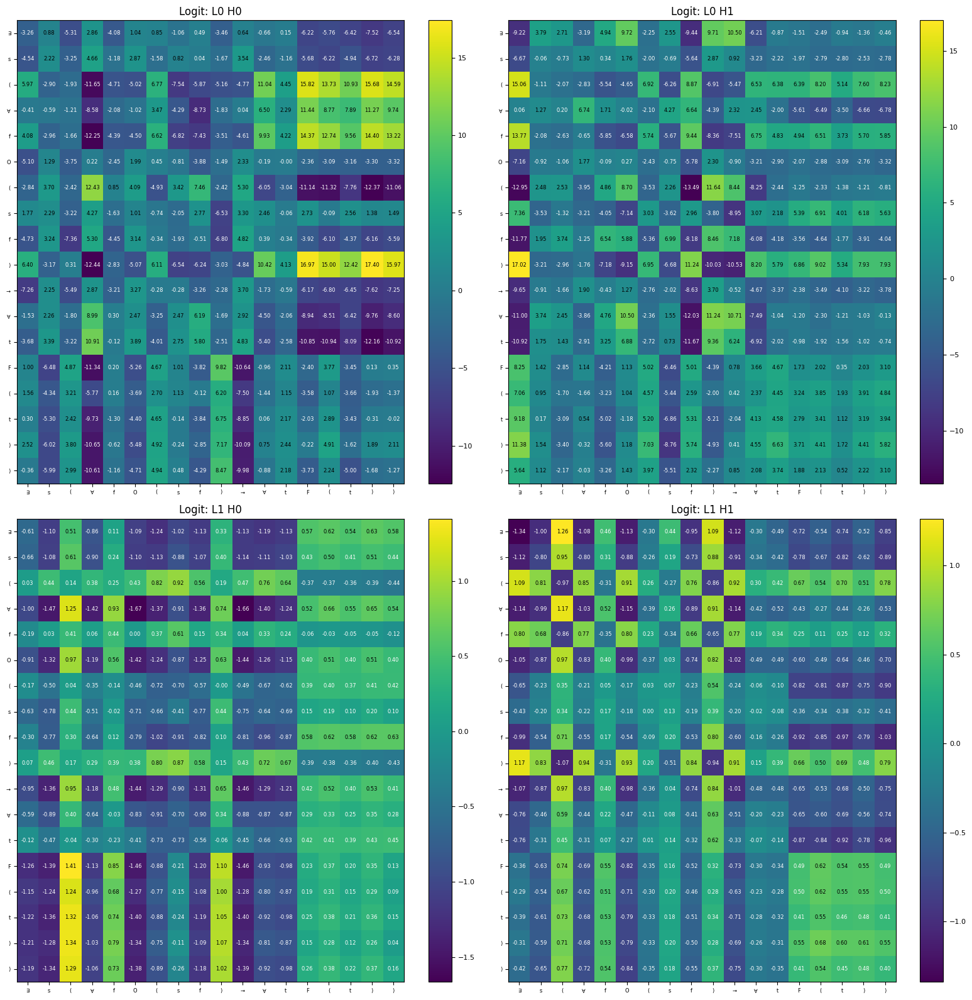

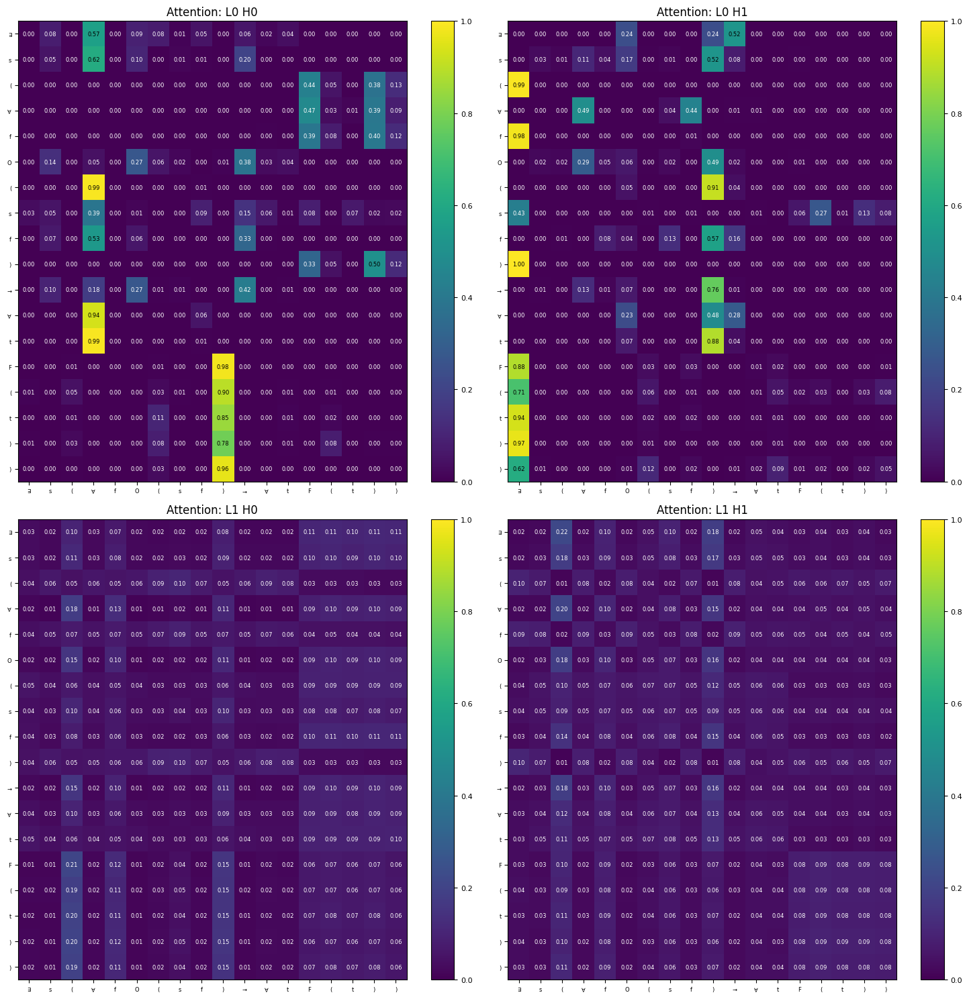

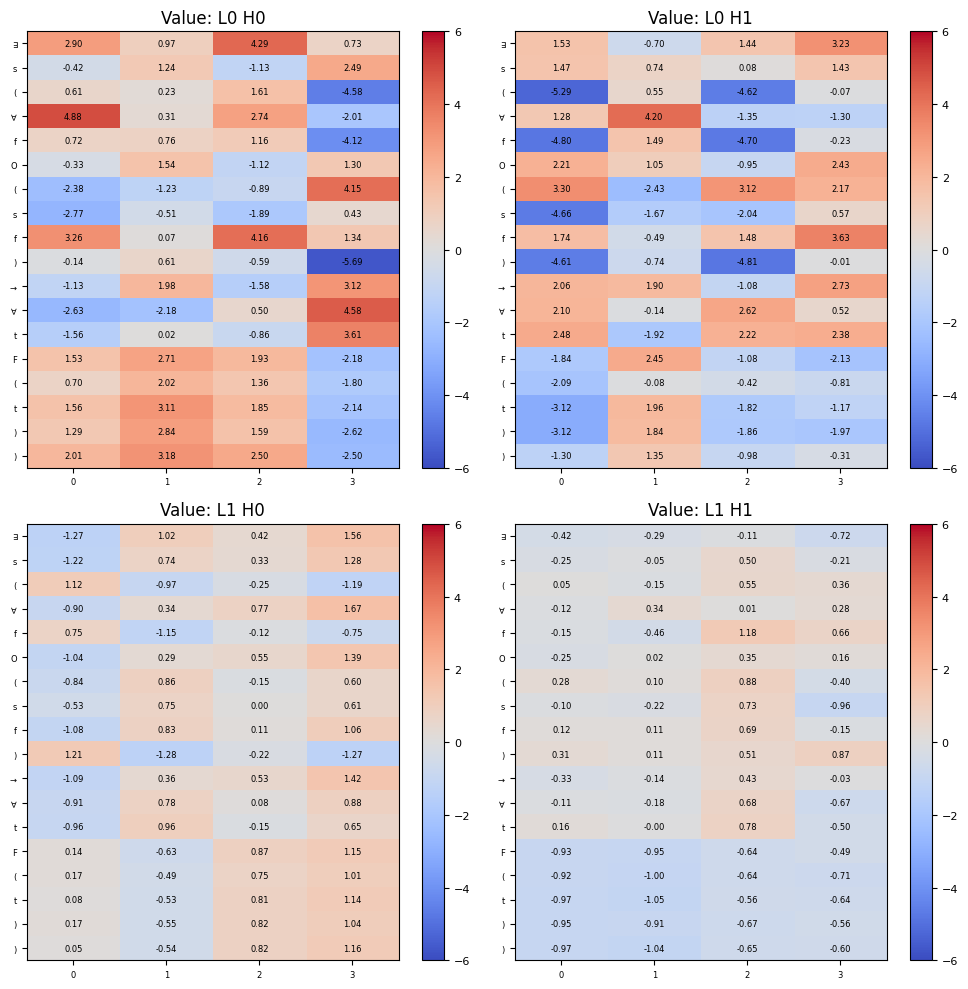

In [ ]:
draw(data, sample_id=18, batch_id=0, figsize=(16, 16), map_type='Logit')
draw(data, sample_id=18, batch_id=0, figsize=(15, 15), map_type='Attention')
draw(data, sample_id=18, batch_id=0, figsize=(10, 10), map_type='Value')

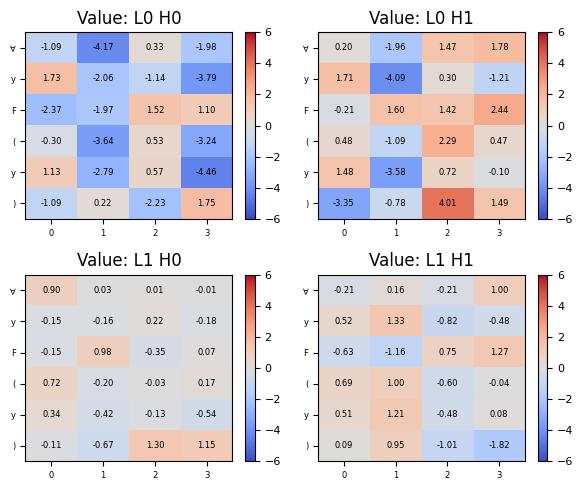

In [ ]:
draw(data, sample_id=4, batch_id=0, figsize=(6, 5), map_type='Value')

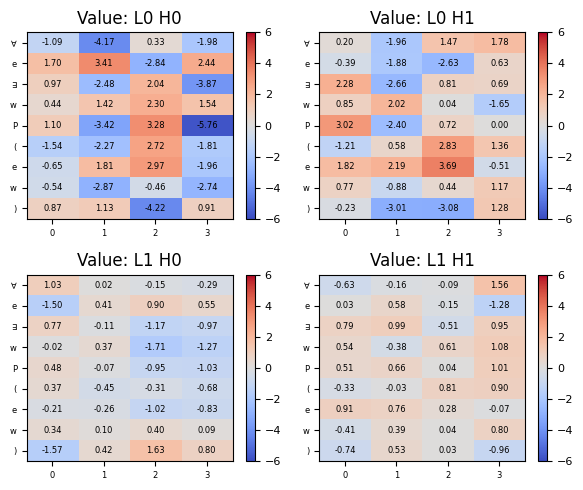

In [ ]:
draw(data, sample_id=7, batch_id=0, figsize=(6, 5), map_type='Value')